# Deep analysis of Omnipeak peak calling

Consider launch Omnipeak with `--deep-analysis` command line argument for:
* GSE26320
* Roadmap
* ABF
* CTCFs
* Immgen

In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

import pandas as pd
import seaborn as sns
from tqdm.auto import tqdm

sns.set_style("whitegrid")
import matplotlib.pyplot as plt
import numpy as np
import os
import re
import math

# Area based PEP triangles

In [2]:
def d(a, b):
    return a / b if b != 0 else 0


def triangle_signed_square(x1, y1, x2, y2, x3, y3):
    return 0.5 * (x1 * y2 - x2 * y1 + x2 * y3 - x3 * y2 + x3 * y1 - x1 * y3)


def detect_sensitivity_triangle(t):
    ns = np.log1p(t['CandidatesN'].values)
    als = np.log1p(t['CandidatesAL'].values)
    im1 = int(len(t) * 0.2)
    im2 = np.argmax(ns)
    max_area = 0
    i1, i2, i3 = -1, -1, -1
    for i in range(im1, im2):
        i1mab = find_sensitivity_max_area_between(ns, als, 0, i, -1)
        i3mab = find_sensitivity_max_area_between(ns, als, i, len(t) - 1, -1)
        if i1mab[0] == -1 or i3mab[0] == -1:
            continue
        # we want area to be balanced between parts, geometric mean is better here
        area = math.sqrt(i1mab[1] * i3mab[1])
        if area > max_area:
            max_area = area
            i1, i3, i2 = i1mab[0], i3mab[0], i
    if i3 == -1 or i2 == -1 or i1 == -1:
        print("Failed to estimate sensitivity triangle")
        return im1, (im1 + im2) / 2, im2

    # Update i3, i1 points to be closer to i2 for more accurate pivot_gap estimation
    i3mab = find_sensitivity_max_area_between(ns, als, i3, i2, -1)
    if i3mab[0] != -1:
        i3 = i3mab[0]
    i1mab = find_sensitivity_max_area_between(ns, als, i2, i1, -1)
    if i1mab[0] != -1:
        i1 = i1mab[0]
    return i1, i2, i3


def find_sensitivity_max_area_between(ns, als, start, end, sign):
    if start > end:
        return find_sensitivity_max_area_between(ns, als, end, start, sign)
    max_i = -1
    max_area = 0
    start_n, start_al = ns[start], als[start]
    end_n, end_al = ns[end], als[end]
    for i in range(start + 1, end):
        n, al = ns[i], als[i]
        area = triangle_signed_square(start_n, start_al, n, al, end_n, end_al)
        if area * sign > 0:
            continue
        area = math.fabs(area)
        if area > max_area:
            max_i, max_area = i, area
    return max_i, max_area

# Plots

In [3]:
def plot_sensitivity(t, name, x='CandidatesN', y='CandidatesAL'):
    plt.figure(figsize=(5, 4))
    ax = plt.axes()
    sns.lineplot(data=t, x=x, y=y, estimator=None,
                 sort=False,
                 legend=False,
                 ax=ax)
    sp = detect_sensitivity_triangle(t)
    sns.scatterplot(data=t[t.index == sp[0]],
                    x=x, y=y, color='green', s=20,
                    legend=False, ax=ax)
    sns.scatterplot(data=t[t.index == sp[1]],
                    x=x, y=y, color='red', s=40,
                    legend=False, ax=ax)
    sns.scatterplot(data=t[t.index == sp[2]],
                    x=x, y=y, color='blue', s=20,
                    legend=False, ax=ax)

    ax.set(xscale='log')
    ax.set(yscale='log')
    ax.set_title(name)
    plt.tight_layout()
    plt.show()
    return sp

In [4]:
def plot_projections(t, name, sp, show_text=False):
    for y in ['CandidatesN', 'CandidatesAL', 'CandidatesML', 'SignalNoiseRatio', 'SignalControlRatio']:
        if y not in t.columns:
            continue
        print(y)
        plt.figure(figsize=(5, 2))
        ax = plt.axes()
        sns.lineplot(data=t, x='SensitivityN', y=y, estimator=None,
                     # marker='o', markersize=3,
                     alpha=1,
                     sort=False,
                     legend=False,
                     ax=ax)

        if sp is not None:
            sns.scatterplot(x=[t['SensitivityN'].values[sp[0]]], y=[t[y].values[sp[0]]],
                            color='green', s=20,
                            legend=False, ax=ax)
            sns.scatterplot(x=[t['SensitivityN'].values[sp[1]]], y=[t[y].values[sp[1]]],
                            color='red', s=40,
                            legend=False, ax=ax)
            sns.scatterplot(x=[t['SensitivityN'].values[sp[2]]], y=[t[y].values[sp[2]]],
                            color='blue', s=20,
                            legend=False, ax=ax)
            if show_text and y in ['CandidatesN', 'CandidatesAL', 'CandidatesML']:
                ax.text(t['SensitivityN'].values[sp[0]], 10,
                        f"t1={t['Sensitivity'].values[sp[0]]:.2e}", fontsize=5)
                ax.text(t['SensitivityN'].values[sp[1]], 100,
                        f"t1={t['Sensitivity'].values[sp[0]]:.2e}", fontsize=5)
                ax.text(t['SensitivityN'].values[sp[2]], 10,
                        f"t1={t['Sensitivity'].values[sp[0]]:.2e}", fontsize=5)

        ax.set(yscale='log')
        ax.set_title(name)
        sens = np.array(t['Sensitivity'])
        # The first and last labels are out of the plot
        sens_ticks = np.array([sens[int(t)] if 0 <= t < len(sens) else np.nan for t in ax.get_xticks()[1:-1]])
        sens_ticks[-1] = sens.max()
        labels = [''] + [f'{t:.1e}' for t in sens_ticks] + ['']
        ax.set_xticklabels(labels)
        ax.set_xlabel('Sensitivity')
        plt.tight_layout()
        plt.show()


# Sample

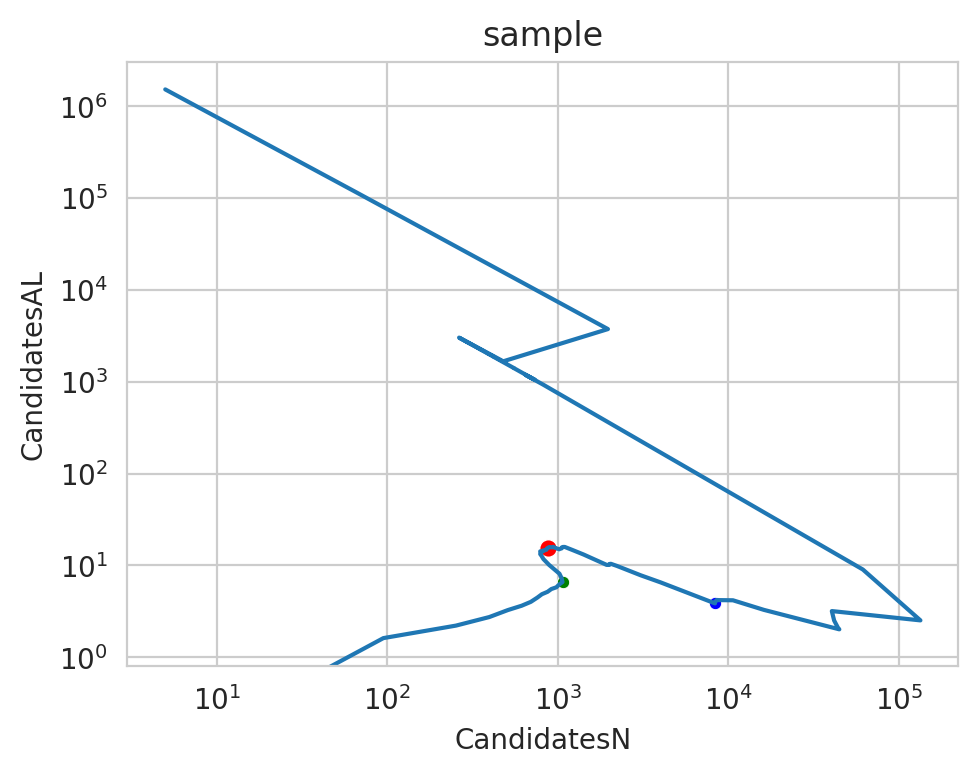

(13, 29, 48)

In [5]:
from io import StringIO

t = pd.read_csv(StringIO('''Sensitivity	CandidatesN	CandidatesAL
-815.292358398438	0	0.0
-603.8041101597811	95	1.6210526315789473
-447.1762793926167	253	2.217391304347826
-331.17797889535314	397	2.748110831234257
-245.26983822617774	509	3.269155206286837
-181.6464178691785	614	3.6482084690553744
-134.52702282241984	695	4.020143884892087
-99.63048036817145	758	4.465699208443271
-73.78616139818661	807	4.867410161090459
-54.64590348014164	871	5.171067738231917
-40.47066157901994	917	5.543075245365322
-29.97250195046672	981	5.7889908256880735
-22.197583091560766	1023	6.249266862170088
-16.43949163540123	1066	6.606003752345216
-12.175059064568838	1053	7.279202279202279
-9.01682768015363	1023	8.137829912023461
-6.6778469806514975	889	10.152980877390327
-4.945601921077916	824	11.745145631067961
-3.6627042267721044	804	12.677860696517413
-2.7125924138047672	789	13.304182509505704
-2.008941248831284	792	13.632575757575758
-1.4878184133808	789	14.242078580481623
-1.1018757429978294	796	14.295226130653266
-0.816047268999801	816	14.213235294117647
-0.6043631956451422	822	14.599756690997568
-0.4475903371358473	838	14.626491646778042
-0.33148462934366296	846	14.72695035460993
-0.24549694301768502	858	14.844988344988344
-0.18181461128487358	864	15.3125
-0.13465158657510598	880	15.67840909090909
-0.09972273206791349	893	15.86562150055991
-0.07385448284741837	924	15.758658008658008
-0.054696502227245425	939	15.91373801916933
-0.040508134923588235	1018	14.99901768172888
-0.03000025464462448	1032	15.184108527131784
-0.022218136688841372	1054	15.345351043643264
-0.016454713593989135	1058	15.771266540642722
-0.012186332420764799	1073	15.910531220876049
-0.00902517670824924	1099	15.909918107370336
-0.006684030256415149	1226	14.677814029363784
-0.004950181244411295	1416	13.168785310734464
-0.0036660956657104927	1934	10.150465356773527
-0.002715104107615297	2005	10.142643391521197
-0.002010801404922089	2010	10.375124378109453
-0.0014891960417635452	2046	10.434017595307918
-0.001102896012194768	2224	9.883543165467627
-8.168028786019711E-4	3063	7.821743388834476
-6.049227988092906E-4	4012	6.542123629112662
-4.480047782710929E-4	8351	3.8689977248233745
-3.3179156373143437E-4	8338	3.950227872391461
-2.4572425809426716E-4	8379	4.023272466881489
-1.8198296043733133E-4	8526	4.202908749706779
-1.347762656661693E-4	10640	4.181578947368421
-9.981506918705786E-5	16150	3.2891021671826626
-7.392286755811186E-5	44728	2.019361473797174
-5.474714782567823E-5	43883	2.1054394640293506
-4.054564296616993E-5	41702	2.520214857800585
-3.0028033036070835E-5	40412	3.1915025240027712
-2.223870931748939E-5	133653	2.527208517579104
-1.6469949647174873E-5	61438	9.041847065334158
-1.219761621539553E-5	819	930.8229548229548
-9.033533467031596E-6	646	1186.5185758513933
-6.690219257512005E-6	735	1045.1945578231293
-4.954764807916571E-6	694	1109.828530259366
-3.6694902449128524E-6	652	1184.4647239263804
-2.7176181270998714E-6	609	1269.7832512315272
-2.012663283403063E-6	581	1333.6919104991393
-1.4905749457454708E-6	552	1406.644927536232
-1.1039172260982598E-6	552	1408.5054347826087
-8.175591878521798E-7	524	1485.3225190839694
-6.05482920131568E-7	499	1562.3006012024048
-4.4841960315335063E-7	471	1658.0191082802548
-3.320987823215804E-7	471	1658.692144373673
-2.4595178365063487E-7	450	1738.5
-1.821514654707547E-7	434	1804.9331797235022
-1.3490106020240573E-7	425	1843.9505882352942
-9.990749180469766E-8	425	1845.8964705882354
-7.399131558884327E-8	414	1897.147342995169
-5.4797840318821614E-8	397	1979.5793450881613
-4.058318573889295E-8	386	2037.761658031088
-3.005583714859979E-8	382	2061.1780104712043
-2.2259300995126772E-8	371	2124.423180592992
-1.6485199808009156E-8	361	2183.714681440443
-1.2208910458126417E-8	356	2216.4606741573034
-9.041897963658835E-9	356	2218.4887640449438
-6.696413989243425E-9	346	2283.1618497109826
-4.959352615519849E-9	338	2339.1597633136093
-3.6728879672868583E-9	326	2427.4447852760736
-2.7201344744119457E-9	317	2498.01261829653
-2.0145268858690564E-9	304	2605.8388157894738
-1.4919551265077232E-9	296	2678.2939189189187
-1.104939385583047E-9	289	2745.3010380622836
-8.18316197398255E-10	278	2856.068345323741
-6.060435600917515E-10	272	2920.7463235294117
-4.488348121379447E-10	264	3011.742424242424
-3.3240628537725375E-10	264	3014.276515151515
-2.4617951988168133E-10	479	1665.2025052192066
-1.823201265294787E-10	1968	3733.5970528455287
-1.3502597029071036E-10	67	112931.58208955223
-9.999999999999925E-11	5	1513298.8'''), sep='\t')
plot_sensitivity(t, 'sample')

# Peak infos

In [6]:
DATASETS = ['ENCODE', 'Roadmap', 'ABF', 'ImmGen']

GSE26320_PATH = os.path.expanduser('~/data/2023_GSE26320')
GSE26320_CELLS = ['GM12878', 'HMEC', 'HSMM', 'K562', 'NHEK', 'NHLF', 'H1', 'Huvec', 'HepG2']
MODIFICATIONS_ABF = ['k4me3', 'k27ac', 'k4me1', 'k27me3', 'k36me3']
MODIFICATIONS = ['H3K4me3', 'H3K27ac', 'H3K4me1', 'H3K27me3', 'H3K36me3']
MODIFICATIONS_ALL = ['CTCF', 'ATAC'] + MODIFICATIONS
GSE26320_REPS = ['rep1', 'rep2']

IMMUNE_PATH = os.path.expanduser('~/data/2023_Immune')
IMMUNE_CELLS = ['CD4ABT', 'TCellBB', 'BCell', 'TCell', 'Monocyte', 'PBMC', 'NK', 'CD34', 'CD4', ]  ## Longest first
IMMUNE_REPS = ['rep1', 'rep2', 'rep3', '']

IMMGEN_PATH = os.path.expanduser('~/data/2024_Immgen')
IMMGEN_CELLS = [
    'Thymus_Thymic_epithelial_Cell', 'Thymus_Double_Negative_Thymocytes',
    'Thymus_Immature_Single_Positive_Thymocytes',
    'Thymus_CD4_SP_Thymocytes_ATAC',
    'Thymus_CD8_SP_Thymocytes',
    'Spleen_CD4_Naive_T_Cell',
    'Spleen_CD8_Naive_T_Cell',
    'Spleen_Activated_T_Cell',
    'Colon_CD4_Treg_Cell',
    'Bone_marrow_Neutrophil',
    'Spleen_Neutrophil_ATAC',
    'Peritoneal_cavity_Neutrophil',
    'Spleen_NK_Cell',
    'Bone_marrow_NK_Cell',
    'Thymus_gdT_Cell',
    'Lymph_nodes_gdT_Cell',
    'Spleen_CD8_T_Cell',
    '']  ## Part, longest first
IMMGEN_REPS = ['']

CTCF_PATH = os.path.expanduser('~/data/2024_TFs')
CTCF_CELLS = [
    'H1',
    'GM12878',
    'HepG2',
    'K562',
    'NHLF',
    'BCell',
    'CD4',
    'Monocyte',
    'NK'
]  ## Longest first
CTCF_REPS = ['rep1', '']

Y20O20_PATH = os.path.expanduser('~/data/2018_chipseq_y20o20')
Y20O20_CELLS = ['']
Y20O20_REPS = [f'OD{i}' for i in range(1, 30)] + [f'YD{i}' for i in range(1, 30)]

In [7]:
def update_abf_modifications(df):
    df.loc[df['modification'] == 'k4me3', 'modification'] = 'H3K4me3'
    df.loc[df['modification'] == 'k27ac', 'modification'] = 'H3K27ac'
    df.loc[df['modification'] == 'k4me1', 'modification'] = 'H3K4me1'
    df.loc[df['modification'] == 'k27me3', 'modification'] = 'H3K27me3'
    df.loc[df['modification'] == 'k36me3', 'modification'] = 'H3K36me3'

In [8]:
def load_peaks_infos(path, suffix, modifications, cells, replicates):
    ts = []
    vals = {}
    for f in tqdm(os.listdir(path)):
        if not f.endswith(f'{suffix}.txt'):
            continue
        if 'ATAC_seq' in f:
            rep = re.sub('_.*', '', os.path.basename(f))
            cell = re.sub('(SRR[0-9]+_)|(_ATAC.*)', '', os.path.basename(f))
        else:
            cell = next((c for c in cells if c in f), None)
            rep = next((r for r in replicates if r in f), None)
        mod = next((m for m in modifications if m.lower() in f.lower()), None)
        if mod and cell is not None and rep is not None:
            txt_path = os.path.join(path, f)
            # print(txt_path, mod, cell, rep)
            with open(txt_path, 'r') as file:
                txt = file.read().rstrip()
                vals = {}
                for (c, text) in [
                    ('peaks', 'Count'),
                    ('length_mean', 'Mean length'),
                    ('length_median', 'Median length'),
                    ('model_signal', 'Signal mean'),
                    ('model_noise', 'Noise mean'),
                    ('model_signal_to_noise', 'Signal to noise'),
                    ('frip', 'FRIP'),
                    ('log_null_pvals_mean', 'LogNullPVals mean'),
                    ('log_null_pvals_std', 'LogNullPVals std'),
                    ('coverage', 'Treatment coverage'),
                    ('control_coverage', 'Control coverage'),
                    ('control_scale', 'Control scale'),
                    ('beta', 'Beta'),
                    ('min_correlation', 'Min control correlation'),
                    ('coverage_non_zero', 'Coverage >0 %'),
                    ('coverage_max', 'Coverage >0 max'),
                    ('coverage_mean', 'Coverage >0 mean'),
                    ('coverage_median', 'Coverage >0 median'),
                    ('coverage_std', 'Coverage >0 std'),
                    ('roughness', 'Track roughness'),
                    ('autocorrelation_average_score', 'Average autocorrelation score'),
                    ('sensitivity_before_merge', 'Sensitivity beforeMerge'),
                    ('sensitivity_before_merge_idx', 'Sensitivity beforeMerge index'),
                    ('sensitivity_stable', 'Sensitivity stable'),
                    ('sensitivity_stable_idx', 'Sensitivity stable index'),
                    ('sensitivity_before_noise', 'Sensitivity beforeNoise'),
                    ('sensitivity_before_noise_idx', 'Sensitivity beforeNoise index'),
                    ('minimal_additional', 'Minimal additional'),
                    ('minimal_additional_idx', 'Minimal additional index'),
                    ('signal_density', 'Candidates signal density'),
                    ('noise_density', 'Candidates noise density'),
                    ('signal_to_noise', 'Coverage signal to noise'),
                    ('signal_to_control', 'Coverage signal to control'),
                ]:
                    try:
                        if text in txt:
                            x = re.sub('\n(\n|.)*', '', re.sub(f'(.|\n)*{text}: ', '', txt)).replace(',', '')
                            vals[c] = float(x)
                    except Exception as e:
                        print(f'Failed to process {c}: {text}: {x}', e)
                fit_snr_adjusted = re.sub('\n(\n|.)*', '',
                                          re.sub('(.|\n)*Out of low noise level down: ', '', txt)) == 'true'
                vals['fit_snr_adjusted'] = fit_snr_adjusted
                fit_low_adjusted = re.sub('\n(\n|.)*', '',
                                          re.sub('(.|\n)*Out of signal-to-noise range down: ', '', txt)) == 'true'
                vals['fit_low_adjusted'] = fit_low_adjusted

                ts.append((txt_path, mod, cell, rep, *vals.values()))
    df = pd.DataFrame(ts, columns=['file', 'modification', 'cell', 'replicate', *vals.keys()])
    return df

In [9]:
gse26320_infos = load_peaks_infos(os.path.join(GSE26320_PATH, 'omnipeak'), '.peak',
                                  MODIFICATIONS, GSE26320_CELLS, GSE26320_REPS)
gse26320_infos['dataset'] = 'ENCODE'
print('ENCODE', len(gse26320_infos))

immune_infos = load_peaks_infos(os.path.join(IMMUNE_PATH, 'omnipeak'), '.peak',
                                MODIFICATIONS, IMMUNE_CELLS, IMMUNE_REPS)
immune_infos['dataset'] = 'Roadmap'
immgen_infos = load_peaks_infos(os.path.join(IMMGEN_PATH, 'omnipeak'), '.peak',
                                ['ATAC'], IMMGEN_CELLS, IMMGEN_REPS)
immgen_infos['dataset'] = 'Immgen'
print('Immgen', len(immgen_infos))

ctcf_infos = load_peaks_infos(os.path.join(CTCF_PATH, 'omnipeak'), '.peak',
                              ['CTCF'], CTCF_CELLS, CTCF_REPS)
ctcf_infos['dataset'] = 'ENCODE'
print('CTCF', len(ctcf_infos))

y20o20_infos = load_peaks_infos(os.path.join(Y20O20_PATH, 'omnipeak'), '.peak',
                                MODIFICATIONS_ABF, Y20O20_CELLS, Y20O20_REPS)
update_abf_modifications(y20o20_infos)
y20o20_infos['dataset'] = 'ABF'
print('ABF', len(y20o20_infos))

full_infos = pd.concat([gse26320_infos, immune_infos, immgen_infos, ctcf_infos, y20o20_infos]).reset_index(drop=True)
full_infos.sample(3)

  0%|          | 0/1038 [00:00<?, ?it/s]

ENCODE 85


  0%|          | 0/562 [00:00<?, ?it/s]

  0%|          | 0/2405 [00:00<?, ?it/s]

Immgen 185


  0%|          | 0/117 [00:00<?, ?it/s]

CTCF 9


  0%|          | 0/2484 [00:00<?, ?it/s]

ABF 191


,file,modification,cell,replicate,peaks,length_mean,length_median,model_signal,model_noise,model_signal_to_noise,...,sensitivity_before_noise_idx,minimal_additional,minimal_additional_idx,signal_density,noise_density,signal_to_noise,signal_to_control,fit_snr_adjusted,fit_low_adjusted,dataset
233,/home/jetbrains/data/2024_Immgen/omnipeak/SRR5...,ATAC,Small_intestine_Dendritic_Cell,SRR5799525,56420.0,475.0,290.0,4.257178,0.300864,14.149864,...,82.0,-0.600970,39.0,0.045625,0.001503,30.350940,NaN,False,False,Immgen
70,/home/jetbrains/data/2023_GSE26320/omnipeak/GS...,H3K27ac,HSMM,rep2,53300.0,1098.0,690.0,5.219786,0.300000,17.399287,...,82.0,-0.641236,37.0,0.053306,0.000967,55.098802,1.0,True,False,ENCODE
75,/home/jetbrains/data/2023_GSE26320/omnipeak/GS...,H3K36me3,K562,rep2,26178.0,9151.0,4395.0,0.931214,0.300000,3.104048,...,83.0,-2.580625,23.0,0.010288,0.001163,8.847065,1.0,True,False,ENCODE


In [10]:
full_infos['modification'].unique()

array(['H3K27ac', 'H3K4me3', 'H3K27me3', 'H3K4me1', 'H3K36me3', 'ATAC',
       'CTCF'], dtype=object)

In [11]:
# Remove outliers
OUTLIERS = {
    'H3K4me3:': {'NK': ['']},
    'H3K27ac': {'': ['YD1', 'YD6']},
    'H3K27me3': {
        'TCell': [''],
        'BCell': [''],
        '': ['OD9', 'YD1', 'YD2', 'YD3', 'YD4', 'YD9', 'YD10', 'YD11']},
    'H3K36me3': {'': ['OD3', 'OD6', 'OD12', 'OD18', 'OD20', 'YD1', 'YD3', 'YD4', 'YD5']},
    'H3K4me3': {'': ['OD6', 'OD7', 'OD14', 'YD2', 'YD3', 'YD10', 'YD14']}
}
full_infos['outlier'] = [
    any(m == mo and c == co and r == ro
        for mo, crlo in OUTLIERS.items()
        for co, rlo in crlo.items()
        for ro in rlo) for m, c, r in zip(full_infos['modification'], full_infos['cell'], full_infos['replicate'])
]
print('Total outliers', sum(full_infos['outlier']))
df_peaks = full_infos[~full_infos['outlier']].copy()
print('Good peaks', len(df_peaks))

Total outliers 51
Good peaks 465


fit_snr_adjusted


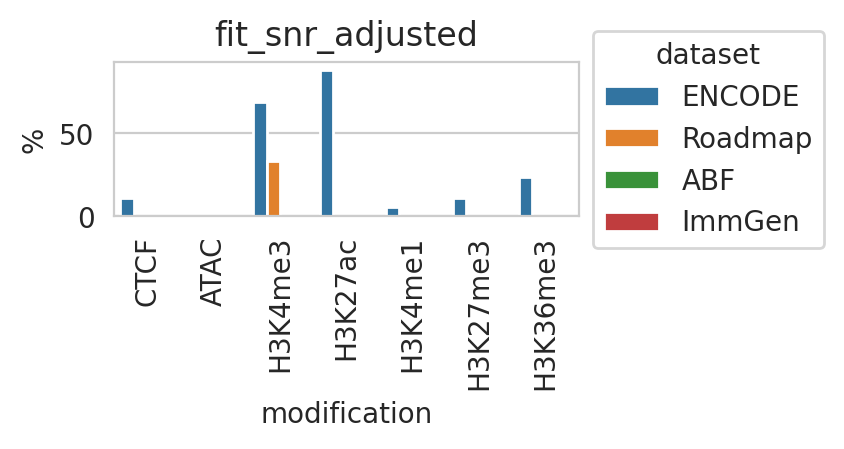

fit_low_adjusted


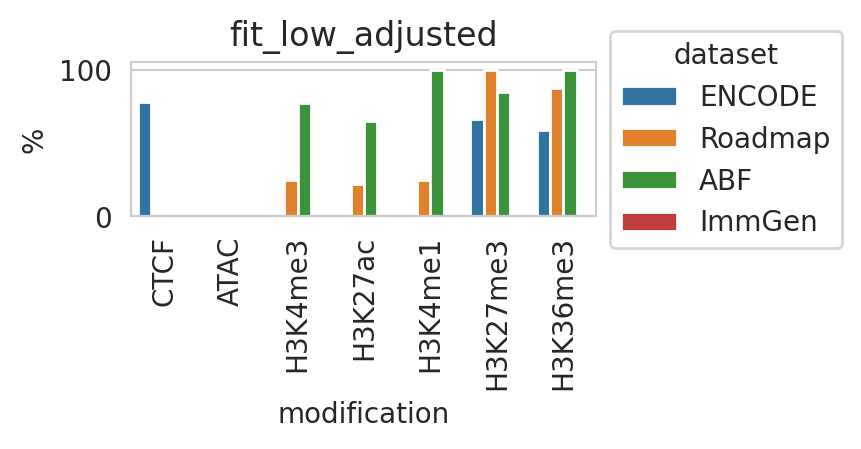

In [12]:
for out in ['fit_snr_adjusted', 'fit_low_adjusted']:
    print(out)
    t = full_infos[['dataset', 'modification']].copy()
    t['number'] = [1 if o == True else 0 for o in full_infos[out]]
    t1 = t.groupby(['dataset', 'modification']).sum().reset_index()
    t2 = t.groupby(['dataset', 'modification']).count().reset_index()
    t1['number'] /= t2['number']
    t1['number'] *= 100
    plt.figure(figsize=(3, 1))
    ax = plt.axes()
    sns.barplot(data=t1, x='modification', y='number',
                hue='dataset',
                order=MODIFICATIONS_ALL,
                hue_order=DATASETS,
                ax=ax)
    ax.xaxis.set_tick_params(rotation=90)
    ax.set_ylabel('%')
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    # plt.tight_layout()
    ax.set_title(f'{out}')
    plt.show()

# Autocorrelation vs fragmentation

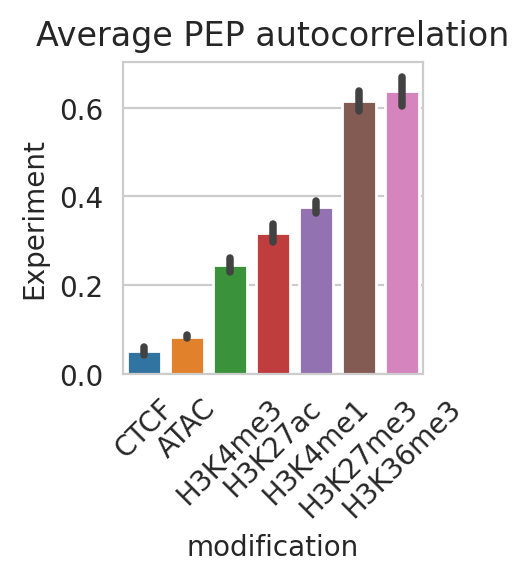

In [13]:
plt.figure(figsize=(2.5, 3))
ax = plt.axes()
sns.barplot(data=df_peaks, x='modification', y='autocorrelation_average_score',
            order=MODIFICATIONS_ALL,
            ax=ax)
ax.xaxis.set_tick_params(rotation=45)
ax.set_title('Average PEP autocorrelation')
ax.set_ylabel('Autocorrelation')
ax.set_ylabel('Experiment')
plt.tight_layout()
plt.show()

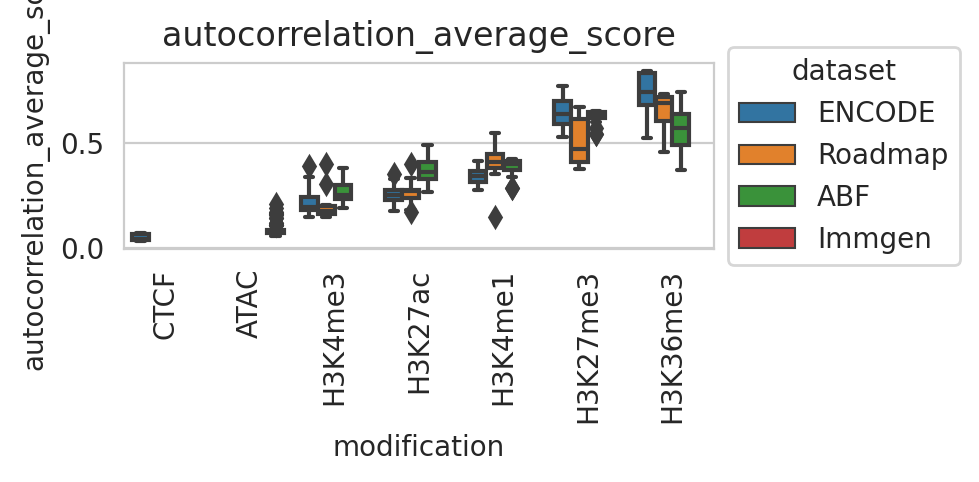

In [14]:
for y in ['autocorrelation_average_score']:
    plt.figure(figsize=(5, 2.5))
    ax = plt.axes()
    sns.boxplot(df_peaks,
                x='modification', y=y,
                hue='dataset',
                order=MODIFICATIONS_ALL,
                hue_order=['ENCODE', 'Roadmap', 'ABF', 'Immgen'],
                ax=ax)
    ax.xaxis.set_tick_params(rotation=90)
    ax.set_title(y)
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

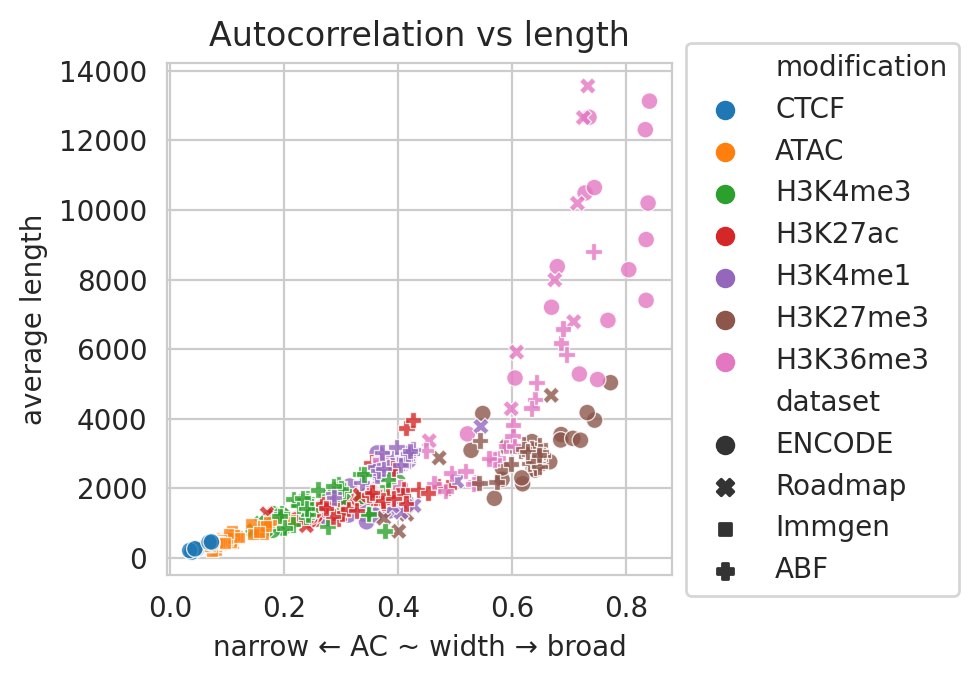

In [15]:
plt.figure(figsize=(5, 3.5))
ax = plt.axes()
sns.scatterplot(df_peaks, x='autocorrelation_average_score', y='length_mean',
                hue='modification',
                hue_order=MODIFICATIONS_ALL,
                style='dataset',
                alpha=0.8,
                ax=ax)
# ax.set_xlabel('autocorrelation')
ax.set_xlabel('narrow ← AC ~ width → broad')
ax.set_ylabel('average length')
ax.set_title('Autocorrelation vs length')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# PEP threshold sensitivity

In [16]:
def load_peaks_sensitivity(path, modifications, cells, replicates):
    ts = []
    for f in tqdm(os.listdir(path)):
        if not f.endswith('.peak.sensitivity.tsv'):
            continue
        if 'ATAC_seq' in f:
            cell = re.sub('(SRR[0-9]+_)|(_ATAC.*)', '', os.path.basename(f))
            rep = re.sub('_.*', '', os.path.basename(f))
        else:
            cell = next((c for c in cells if f'{c}_' in f), None)
            rep = next((r for r in replicates if f'{r}_' in f or f'{r}-' in f), None)
        mod = next((m for m in modifications if m.lower() in f.lower()), None)
        if cell is not None and mod and rep is not None:
            try:
                tsv_path = os.path.join(path, f)
                # print(tsv_path, mod, cell, rep)
                t = pd.read_csv(tsv_path, sep='\t')
                t['file'] = tsv_path
                t['modification'] = mod
                t['cell'] = cell
                t['replicate'] = rep
                t['SensitivityN'] = range(len(t))
                ts.append(t)
            except Exception as e:
                print(e)
    df = pd.concat(ts).reset_index(drop=True)
    return df


In [17]:
gse26320_sensitivity = load_peaks_sensitivity(GSE26320_PATH + '/omnipeak', MODIFICATIONS, GSE26320_CELLS, GSE26320_REPS)
gse26320_sensitivity['dataset'] = 'ENCODE'
print('ENCODE', len(gse26320_sensitivity))

immune_sensitivity = load_peaks_sensitivity(IMMUNE_PATH + '/omnipeak', MODIFICATIONS, IMMUNE_CELLS, IMMUNE_REPS)
immune_sensitivity['dataset'] = 'Roadmap'
print('Immune', len(immune_sensitivity))

abf_sensitivity = load_peaks_sensitivity(Y20O20_PATH + '/omnipeak', MODIFICATIONS_ABF, Y20O20_CELLS, Y20O20_REPS)
update_abf_modifications(abf_sensitivity)
abf_sensitivity['dataset'] = 'ABF'
print('ABF', len(abf_sensitivity))

immgen_sensitivity = load_peaks_sensitivity(IMMGEN_PATH + '/omnipeak', ['ATAC'], IMMGEN_CELLS, IMMGEN_REPS)
immgen_sensitivity['dataset'] = 'ImmGen'
print('ImmGen', len(immgen_sensitivity))

ctcf_sensitivity = load_peaks_sensitivity(CTCF_PATH + '/omnipeak', ['CTCF'], CTCF_CELLS, CTCF_REPS)
ctcf_sensitivity['dataset'] = 'ENCODE'
print('CTCF', len(ctcf_sensitivity))

full_sensitivity = pd.concat(
    [gse26320_sensitivity, immune_sensitivity, abf_sensitivity, immgen_sensitivity, ctcf_sensitivity]).reset_index(
    drop=True)

# For log scale
full_sensitivity.fillna(0, inplace=True)
full_sensitivity['CandidatesFootprint'] = full_sensitivity['CandidatesAL'] * full_sensitivity['CandidatesN']
full_sensitivity['CandidatesN'] += 1
full_sensitivity['CandidatesAL'] += 1
full_sensitivity.sample(3)

  0%|          | 0/1038 [00:00<?, ?it/s]

ENCODE 8500


  0%|          | 0/562 [00:00<?, ?it/s]

Immune 4600


  0%|          | 0/2484 [00:00<?, ?it/s]

ABF 19100


  0%|          | 0/2405 [00:00<?, ?it/s]

ImmGen 18500


  0%|          | 0/117 [00:00<?, ?it/s]

CTCF 900


,Sensitivity,CandidatesN,CandidatesAL,CandidatesML,SignalNoiseRatio,SignalControlRatio,file,modification,cell,replicate,SensitivityN,dataset,CandidatesFootprint
23678,-2.496521e-08,512699,48.481697,18.0,48.921248,1.0,/home/jetbrains/data/2018_chipseq_y20o20/omnip...,H3K36me3,,YD15,78,ABF,24343771.0
21949,-1.253519e-02,196791,9.985497,4.0,4.576640,1.0,/home/jetbrains/data/2018_chipseq_y20o20/omnip...,H3K27me3,,YD20,49,ABF,1768256.0
34674,-1.497108e-03,934152,9.070837,4.0,6.807850,0.0,/home/jetbrains/data/2024_Immgen/omnipeak/SRR8...,ATAC,Thymus_DP_Thymocytes,SRR8186433,74,ImmGen,7539380.0


## Examples

In [18]:
EXAMPLES = [
    ('CTCF', 'H1', '', 'ENCODE'),
    ('ATAC', 'Spleen_NKT_Cell', 'SRR5799482', 'ImmGen'),
    ('H3K4me3', 'K562', 'rep1', 'ENCODE'),
    ('H3K27ac', 'K562', 'rep1', 'ENCODE'),
    ('H3K4me1', 'CD34', '', 'Roadmap'),
    ('H3K27me3', 'Monocyte', '', 'Roadmap'),
    ('H3K36me3', 'CD4', '', 'Roadmap'),
]


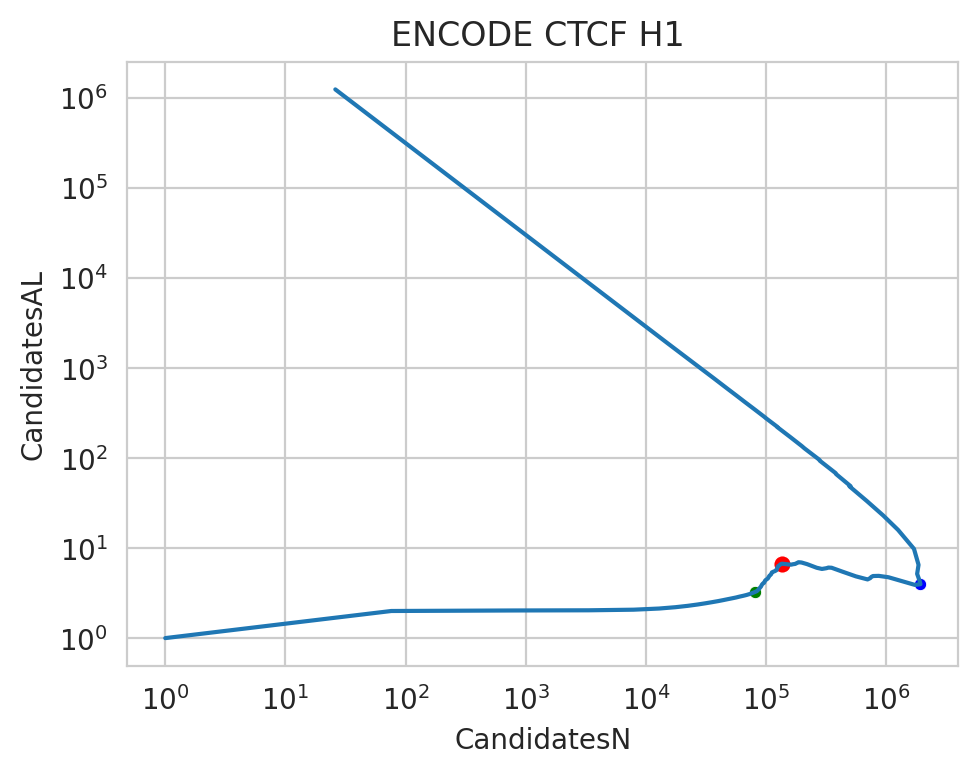

CandidatesN


/tmp/ipykernel_4137033/4060781841.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


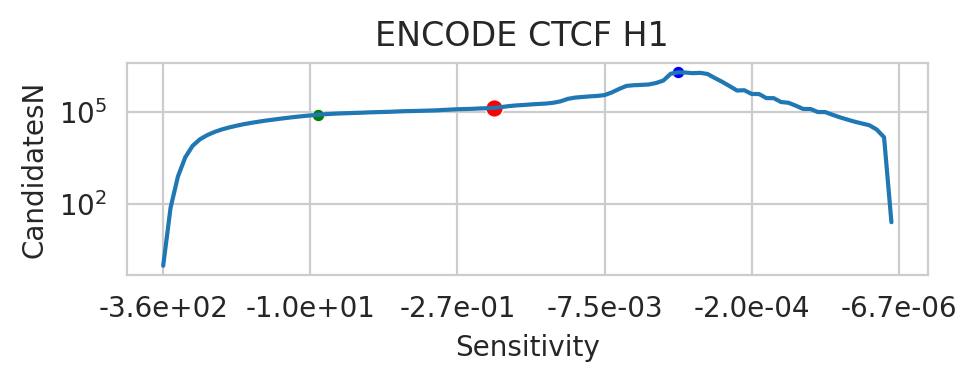

CandidatesAL


/tmp/ipykernel_4137033/4060781841.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


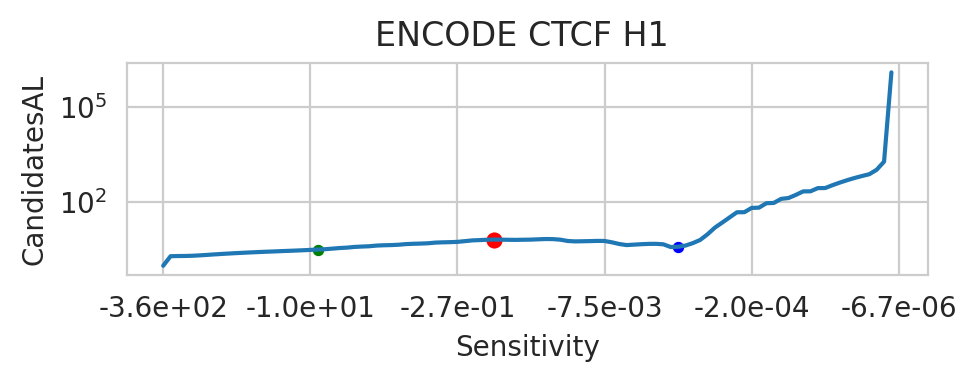

CandidatesML


/tmp/ipykernel_4137033/4060781841.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


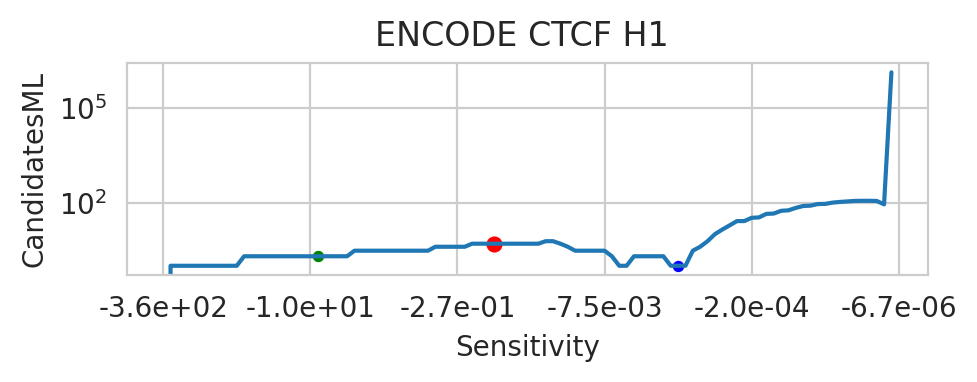

SignalNoiseRatio


/tmp/ipykernel_4137033/4060781841.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


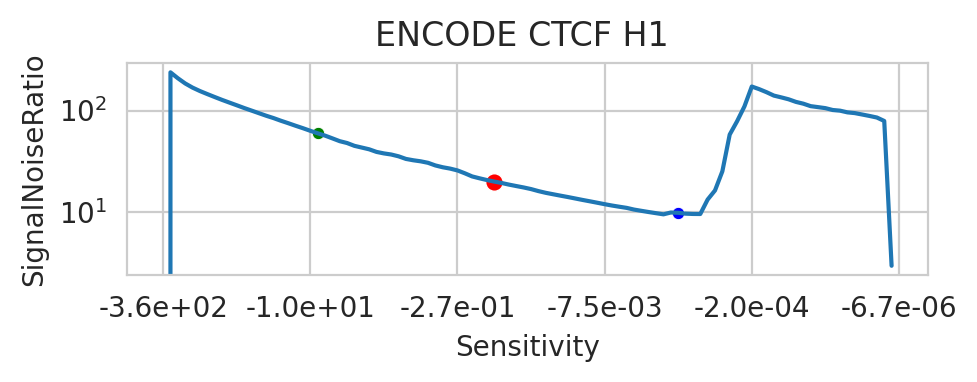

SignalControlRatio


/tmp/ipykernel_4137033/4060781841.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


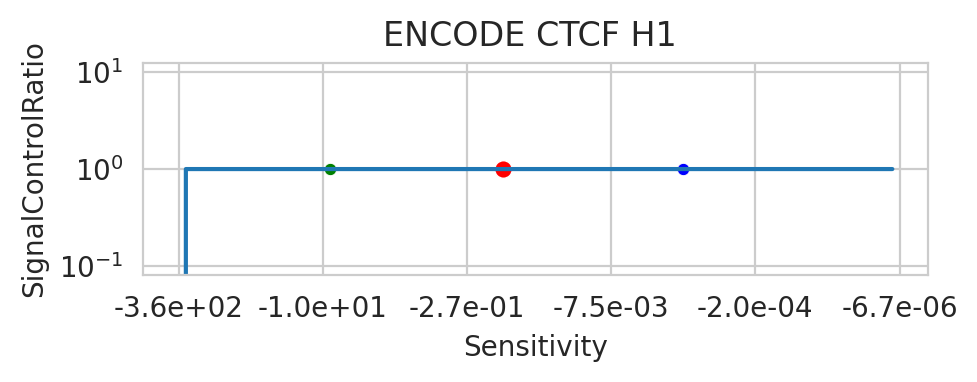

In [19]:
for (m, c, r, ds) in EXAMPLES:
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)].copy().reset_index(drop=True)
    if len(t) == 0:
        continue
    name = f'{ds} {m} {c} {r}'
    sp = plot_sensitivity(t, name)
    plot_projections(t, name, sp)
    break

## Supplementary Figure

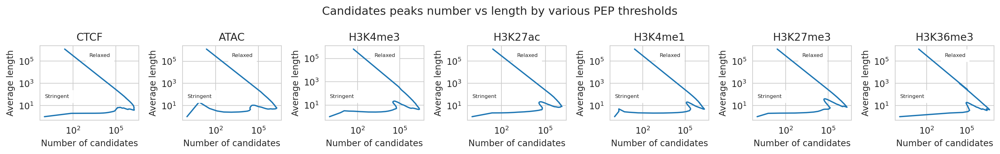

In [20]:
fig = plt.figure(figsize=(16, 2.5))
fig.suptitle('Candidates peaks number vs length by various PEP thresholds', fontsize=13)
axs = [plt.subplot(1, 7, i + 1) for i in range(len(EXAMPLES))]

for i, (m, c, r, ds) in enumerate(EXAMPLES):
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)].copy().reset_index(drop=True)
    if len(t) == 0:
        continue
    ax = axs[i]
    ax.set_title(m)
    sns.lineplot(data=t, x='CandidatesN', y='CandidatesAL', estimator=None,
                 sort=False,
                 ax=ax)
    ax.set(yscale='log')
    ax.set(xscale='log')
    ax.set_xlabel('Number of candidates')
    ax.set_ylabel('Average length')
    ax.text(0.05, 0.35, "Stringent",
            transform=ax.transAxes, fontsize=6,
            verticalalignment='top', bbox=dict(facecolor='white', alpha=1))
    ax.text(0.5, 0.9, "Relaxed",
            transform=ax.transAxes, fontsize=6,
            verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

plt.tight_layout()
plt.show()


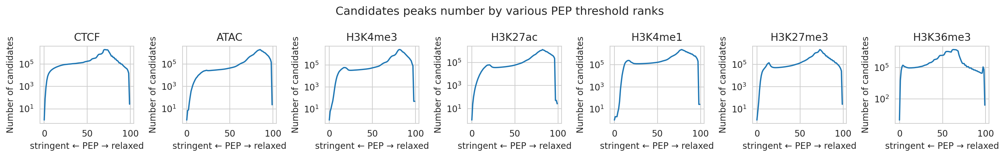

In [21]:
fig = plt.figure(figsize=(16, 2.5))
fig.suptitle('Candidates peaks number by various PEP threshold ranks', fontsize=13)
axs = [plt.subplot(1, 7, i + 1) for i in range(len(EXAMPLES))]

for i, (m, c, r, ds) in enumerate(EXAMPLES):
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)].copy().reset_index(drop=True)
    if len(t) == 0:
        continue
    ax = axs[i]
    ax.set_title(m)
    sns.lineplot(data=t, x='SensitivityN', y='CandidatesN', estimator=None,
                 sort=False,
                 ax=ax)
    ax.set(yscale='log')
    ax.set_xlabel('stringent ← PEP → relaxed')
    ax.set_ylabel('Number of candidates')

plt.tight_layout()
plt.show()


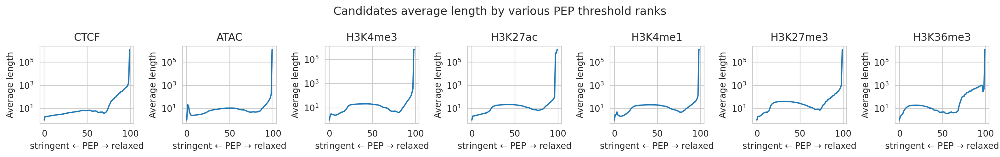

In [22]:
fig = plt.figure(figsize=(16, 2.5))
fig.suptitle('Candidates average length by various PEP threshold ranks', fontsize=13)
axs = [plt.subplot(1, 7, i + 1) for i in range(len(EXAMPLES))]

for i, (m, c, r, ds) in enumerate(EXAMPLES):
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)].copy().reset_index(drop=True)
    if len(t) == 0:
        continue
    ax = axs[i]
    ax.set_title(m)
    sns.lineplot(data=t, x='SensitivityN', y='CandidatesAL', estimator=None,
                 sort=False,
                 ax=ax)
    ax.set(yscale='log')
    ax.set_xlabel('stringent ← PEP → relaxed')
    ax.set_ylabel('Average length')

plt.tight_layout()
plt.show()


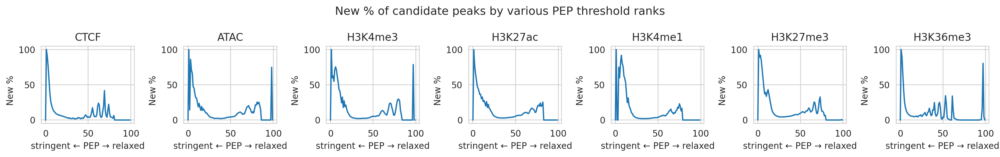

In [23]:
fig = plt.figure(figsize=(16, 2.5))
fig.suptitle('New % of candidate peaks by various PEP threshold ranks', fontsize=13)
axs = [plt.subplot(1, 7, i + 1) for i in range(len(EXAMPLES))]

for i, (m, c, r, ds) in enumerate(EXAMPLES):
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)].copy().reset_index(drop=True)
    if len(t) == 0:
        continue
    ax = axs[i]
    ax.set_title(m)
    segments = t['file'].values[0].replace('.sensitivity.tsv', '.segments.tsv')
    if not os.path.exists(segments):
        continue
    sdf = pd.read_csv(segments, sep='\t')
    sdf['New %'] = [d(n, t) * 100 for n, t in zip(sdf['New'], sdf['CandidatesN'])]
    sdf['SensitivityN'] = range(len(sdf))
    sns.lineplot(data=sdf, x='SensitivityN', y='New %',
                 sort=False,
                 estimator=None,
                 ax=ax)
    ax.set_ylabel('New %    ')
    ax.set_xlabel('stringent ← PEP → relaxed')

plt.tight_layout()
plt.show()


## All

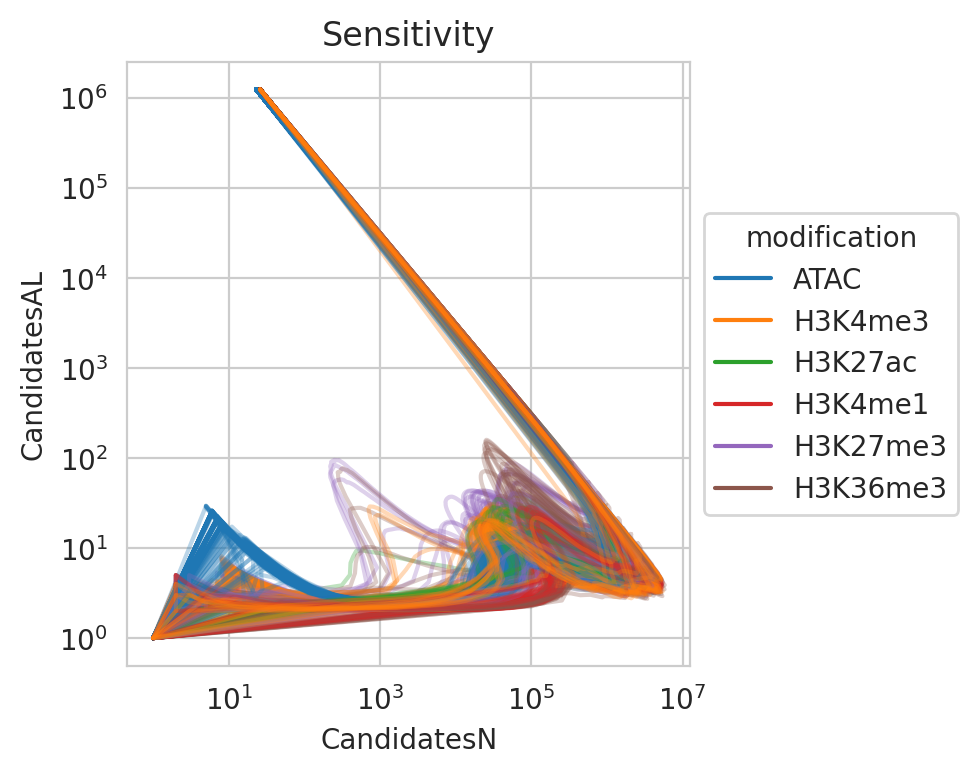

In [24]:
dfg = full_sensitivity.copy()
dfg.sort_values(by=['dataset', 'modification', 'cell', 'replicate', 'SensitivityN'], inplace=True)
plt.figure(figsize=(5, 4))
ax = plt.axes()
for i, (_, t) in enumerate(dfg.groupby(['dataset', 'modification', 'cell', 'replicate'])):
    sns.lineplot(data=t, x='CandidatesN', y='CandidatesAL',
                 hue='modification',
                 hue_order=['ATAC'] + MODIFICATIONS,
                 sort=False,
                 estimator=None,
                 alpha=0.3,
                 legend=i == 0,
                 ax=ax)
ax.set(xscale='log')
ax.set(yscale='log')
ax.set_title('Sensitivity')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# Triangles
Estimate the phases in PEP thresholding by number vs average candidate length plot.

In [25]:
sps = {}
for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        dfdsm = full_sensitivity[(full_sensitivity['dataset'] == ds) & (full_sensitivity['modification'] == m)]
        for i, ((cell, rep), t) in enumerate(dfdsm.groupby(['cell', 'replicate'])):
            # print(ds, m, cell, rep)
            tt = t.sort_values(by=['Sensitivity']).copy().reset_index(drop=True)
            sp = detect_sensitivity_triangle(tt)
            name = f'{ds} {m} {cell} {rep}'
            sps[name] = sp

## All

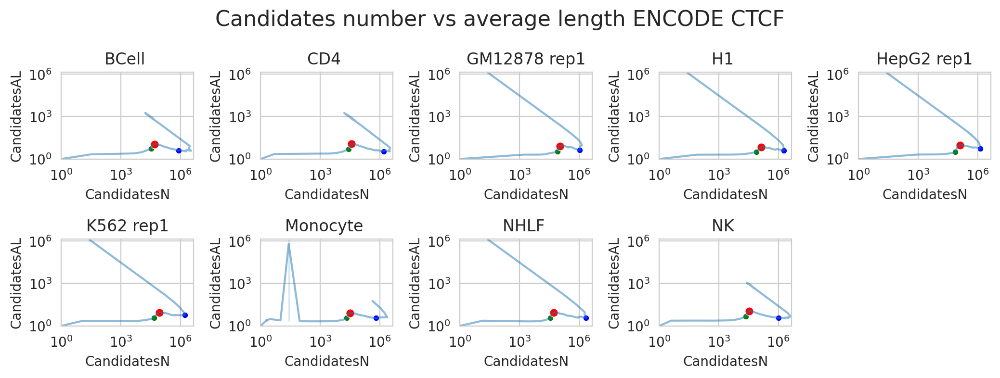

<Figure size 50x200 with 0 Axes>

<Figure size 50x200 with 0 Axes>

<Figure size 50x200 with 0 Axes>

<Figure size 50x200 with 0 Axes>

<Figure size 50x200 with 0 Axes>

<Figure size 50x200 with 0 Axes>

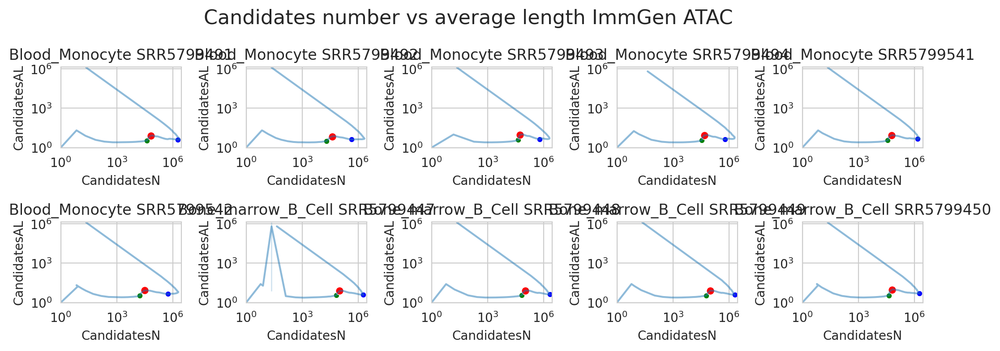

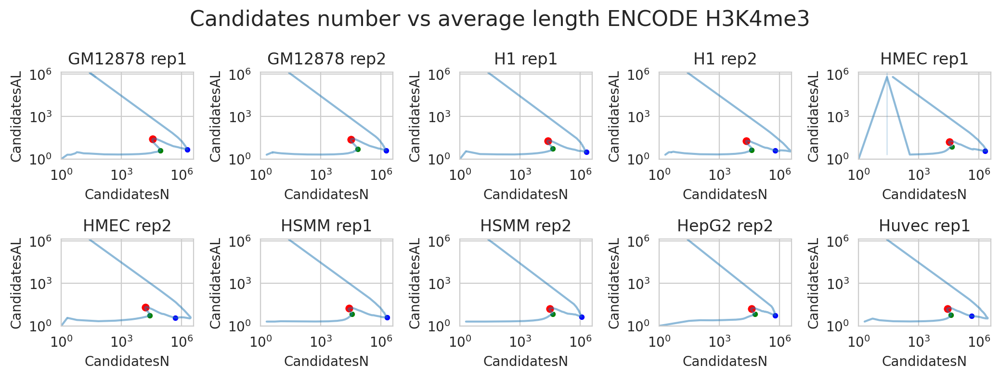

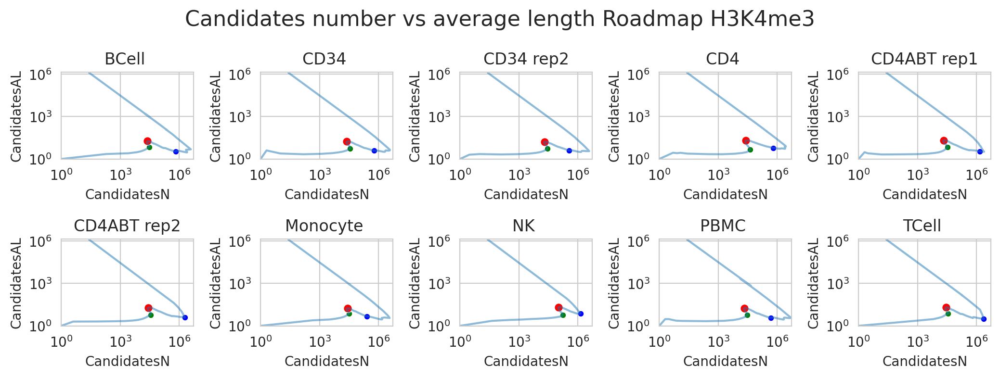

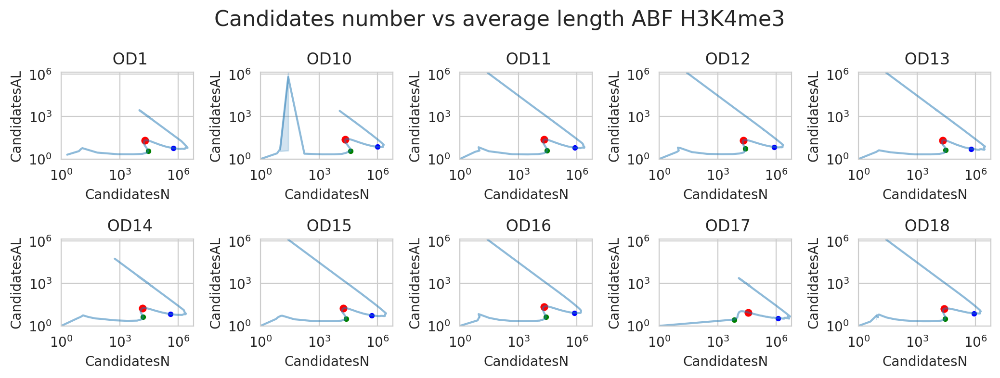

<Figure size 50x200 with 0 Axes>

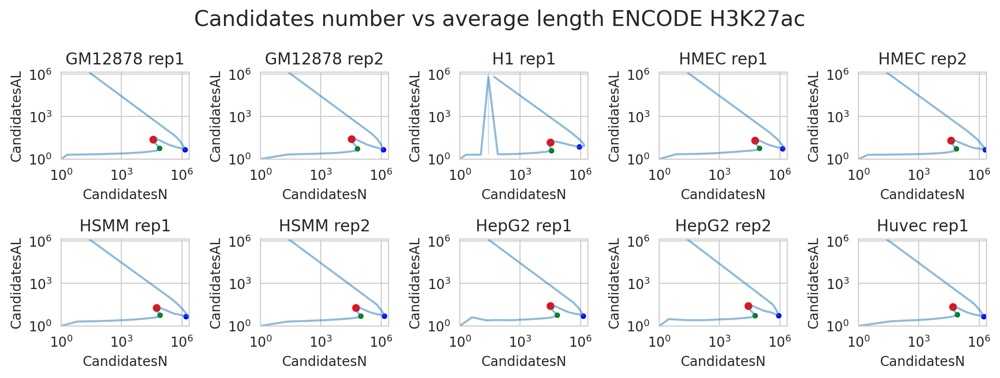

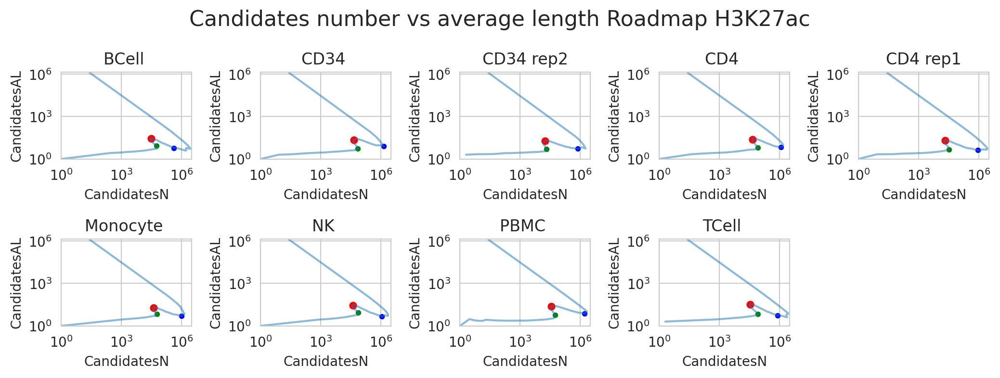

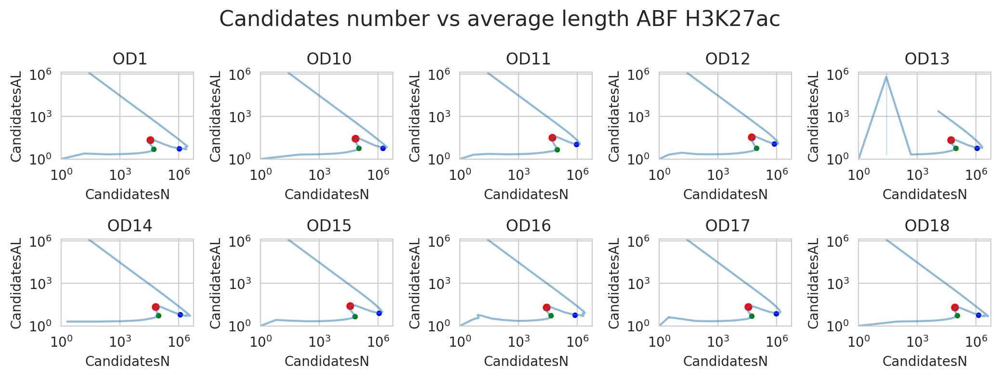

<Figure size 50x200 with 0 Axes>

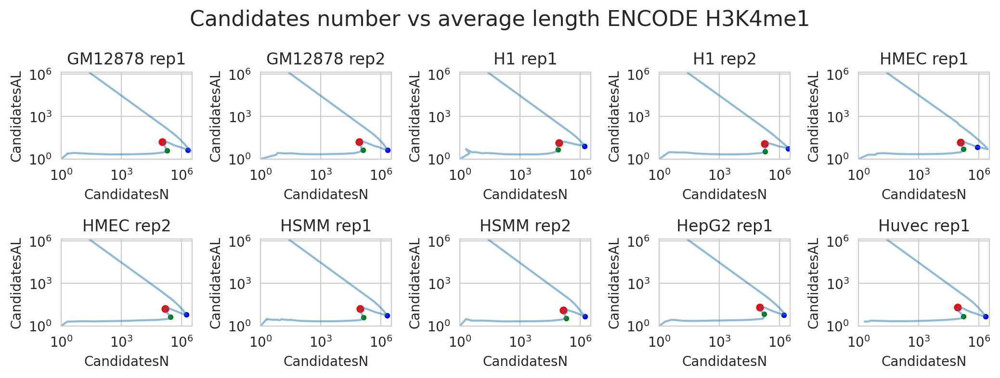

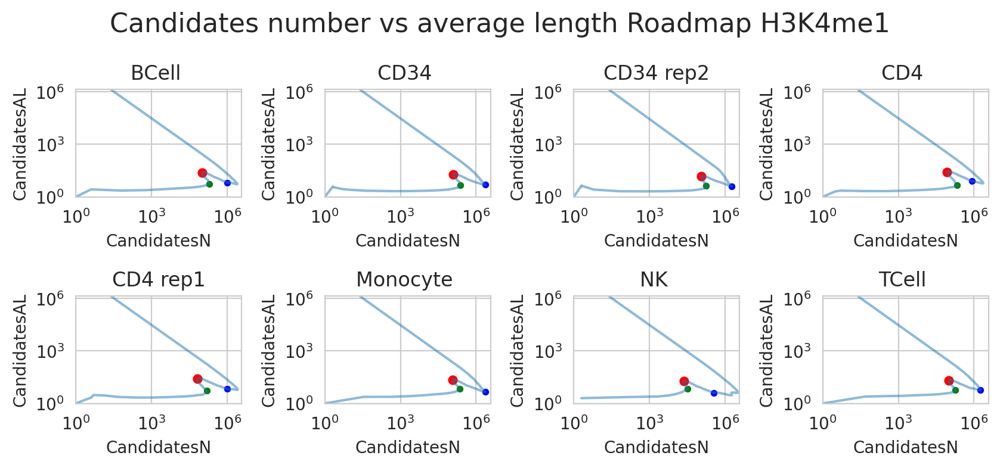

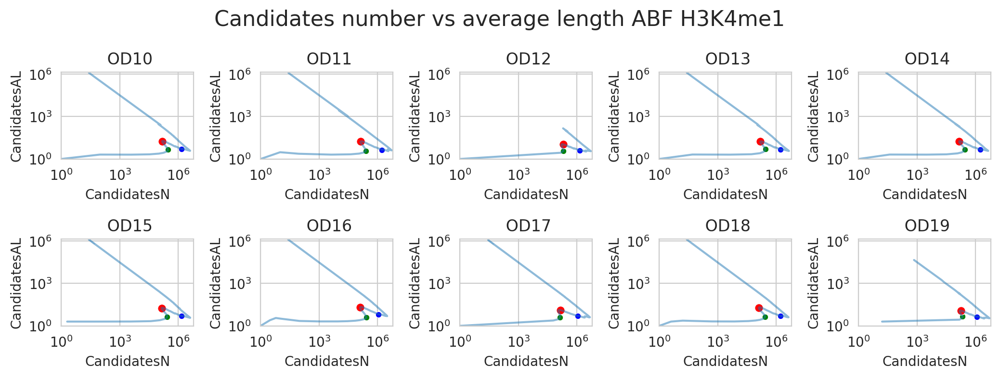

<Figure size 50x200 with 0 Axes>

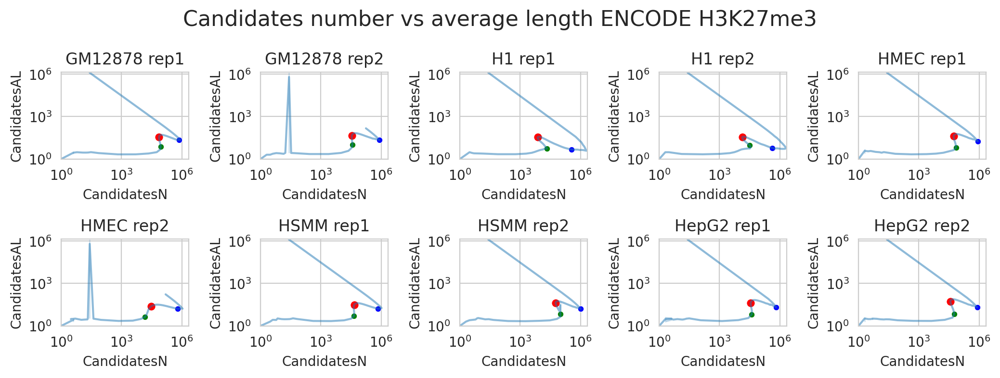

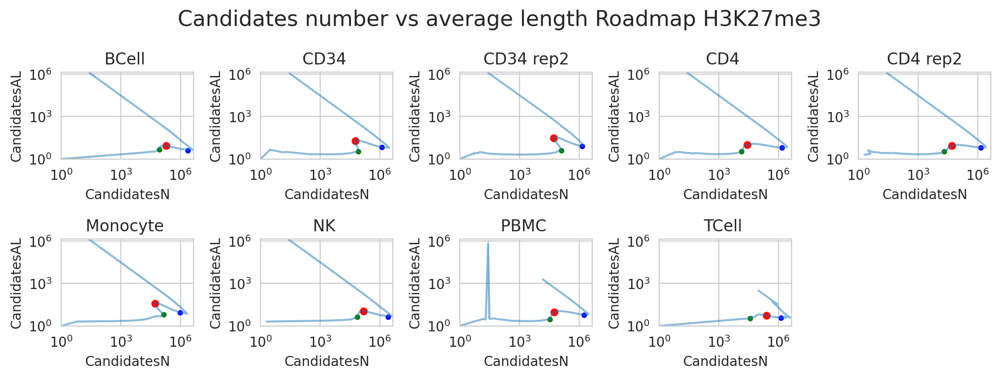

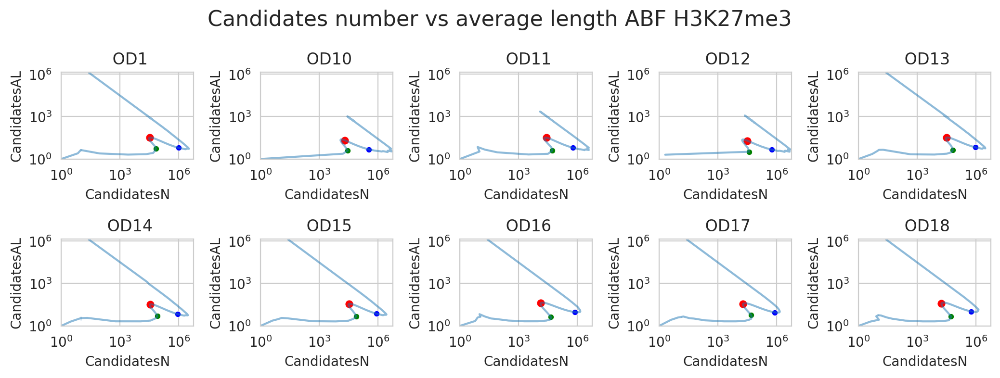

<Figure size 50x200 with 0 Axes>

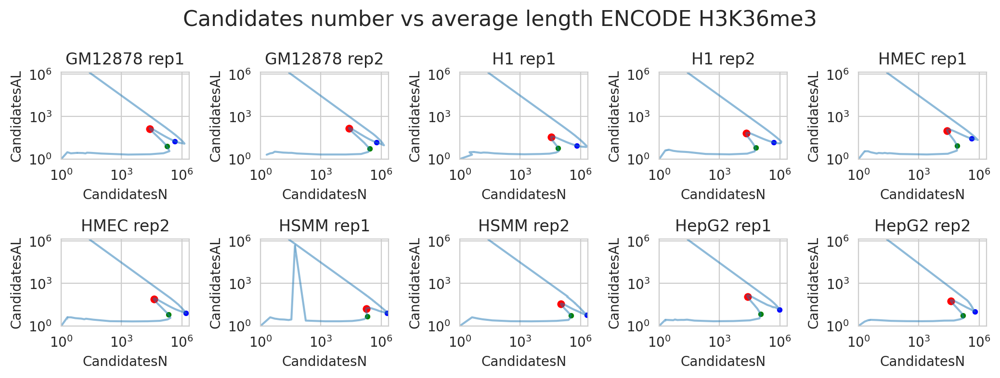

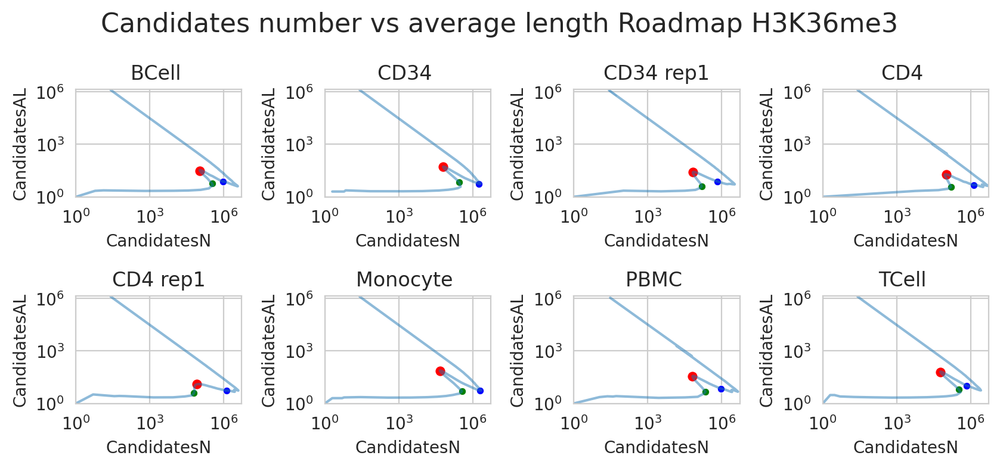

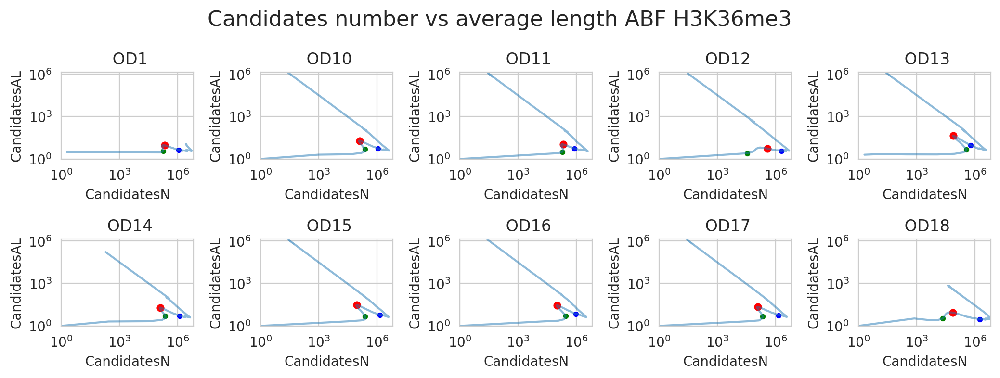

<Figure size 50x200 with 0 Axes>

In [26]:
MAX_N = 10

for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        dfdsm = full_sensitivity[(full_sensitivity['dataset'] == ds) & (full_sensitivity['modification'] == m)]
        t = dfdsm
        minx, maxx = t['CandidatesN'].min(), t['CandidatesN'].max()
        minx, maxx = 1, maxx + (maxx - minx) * 0.1
        miny, maxy = t['CandidatesAL'].min(), t['CandidatesAL'].max()
        miny, maxy = 1, maxy + (maxy - miny) * 0.1
        n = min(len(dfdsm[['cell', 'replicate']].copy().drop_duplicates()), MAX_N)
        if n <= 6:
            ncols, nrows = n, 1
        else:
            ncols = int(math.floor(math.sqrt(n) + 2))
            nrows = int(math.ceil(n / ncols))
        fig = plt.figure(figsize=(2 * ncols + .5, 2 * nrows))
        fig.suptitle(f'Candidates number vs average length {ds} {m}', fontsize=16)
        axs = [plt.subplot(nrows, ncols, i + 1) for i in range(n)]
        for i, ((cell, rep), t) in enumerate(dfdsm.groupby(['cell', 'replicate'])):
            if i == MAX_N:
                break
            tt = t.sort_values(by=['Sensitivity']).copy().reset_index(drop=True)
            ax = axs[i]
            sns.lineplot(data=tt, x="CandidatesN", y="CandidatesAL",
                         sort=False,
                         alpha=0.5,
                         ax=ax)
            sp = detect_sensitivity_triangle(tt)
            st = full_infos[(full_infos['dataset'] == ds) &
                            (full_infos['modification'] == m) &
                            (full_infos['cell'] == cell) &
                            (full_infos['replicate'] == rep)]
            name = f'{ds} {m} {cell} {rep}'
            sp = sps[name] if name in sps else None
            if sp is not None:
                sns.scatterplot(data=tt[tt.index.isin([sp[0], ])],
                                x="CandidatesN", y="CandidatesAL", color='green', s=20,
                                legend=False, ax=ax)
                sns.scatterplot(data=tt[tt.index.isin([sp[1], ])],
                                x="CandidatesN", y="CandidatesAL", color='red', s=40,
                                legend=False, ax=ax)
                sns.scatterplot(data=tt[tt.index.isin([sp[2], ])],
                                x="CandidatesN", y="CandidatesAL", color='blue', s=20,
                                legend=False, ax=ax)
            ax.set(yscale='log')
            ax.set(xscale='log')
            ax.set_title(f'{cell} {rep}')
            ax.set_xlim(minx, maxx)
            ax.set_ylim(miny, maxy)
        plt.tight_layout()
        plt.show()


# Candidates features

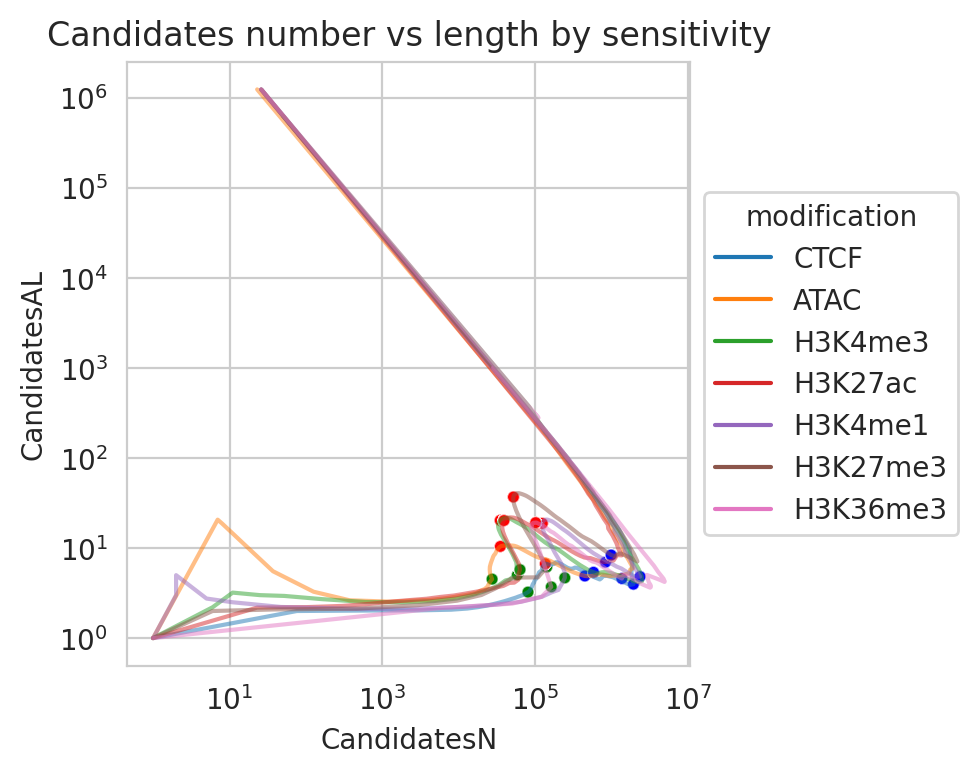

In [27]:
ts = []
for (m, c, r, ds) in EXAMPLES:
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)].copy().reset_index(drop=True)
    name = f'{ds} {m} {c} {r}'
    sp = sps[name] if name in sps else None
    if sp is not None:
        t['S2CN0'] = t[t.index == sp[0]]['CandidatesN'].values[0]
        t['S2CAL0'] = t[t.index == sp[0]]['CandidatesAL'].values[0]
        t['S2CN1'] = t[t.index == sp[1]]['CandidatesN'].values[0]
        t['S2CAL1'] = t[t.index == sp[1]]['CandidatesAL'].values[0]
        t['S2CN2'] = t[t.index == sp[2]]['CandidatesN'].values[0]
        t['S2CAL2'] = t[t.index == sp[2]]['CandidatesAL'].values[0]

    ts.append(t)

t = pd.concat(ts).reset_index(drop=True)
plt.figure(figsize=(5, 4))
ax = plt.axes()
sns.lineplot(data=t, x='CandidatesN', y='CandidatesAL',
             hue='modification',
             hue_order=MODIFICATIONS_ALL,
             sort=False,
             estimator=None,
             alpha=0.5,
             ax=ax)

sns.scatterplot(data=t, x='S2CN0', y='S2CAL0', color='green',
                alpha=0.3, size=10, legend=False,
                ax=ax)
sns.scatterplot(data=t, x='S2CN1', y='S2CAL1', color='red',
                alpha=0.3, size=10, legend=False,
                ax=ax)
sns.scatterplot(data=t, x='S2CN2', y='S2CAL2', color='blue',
                alpha=0.3, size=10, legend=False,
                ax=ax)

ax.set(xscale='log')
ax.set(yscale='log')
ax.set_title('Candidates number vs length by sensitivity')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [28]:
sensitivities = list(sorted(full_sensitivity['Sensitivity'].unique()))
ts = []
for (m, c, r, ds) in EXAMPLES:
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)].copy().reset_index(drop=True)
    name = f'{ds} {m} {c} {r}'
    sp = sps[name] if name in sps else None
    if sp is None:
        continue
    t['S2N'] = sp[1]
    t['S2CN'] = t[t.index == sp[1]]['CandidatesN'].values[0]
    t['S2CAL'] = t[t.index == sp[1]]['CandidatesAL'].values[0]
    t['S2CFT']  = t[t.index == sp[1]]['CandidatesFootprint'].values[0]
    ts.append(t)
t = pd.concat(ts).reset_index(drop=True)
display(t.sample(10))


,Sensitivity,CandidatesN,CandidatesAL,CandidatesML,SignalNoiseRatio,SignalControlRatio,file,modification,cell,replicate,SensitivityN,dataset,CandidatesFootprint,S2N,S2CN,S2CAL,S2CFT
370,-0.000874,338277,8.678467,3.0,23.074337,1.0,/home/jetbrains/data/2023_GSE26320/omnipeak/GS...,H3K27ac,K562,rep1,70,ENCODE,2597441.0,33,38934,20.217579,748198.0
169,-0.002588,216993,6.257613,2.0,10.493183,0.0,/home/jetbrains/data/2024_Immgen/omnipeak/SRR5...,ATAC,Spleen_NKT_Cell,SRR5799482,69,ImmGen,1140860.0,44,34919,10.427172,329178.0
584,-0.000006,339988,74.651816,27.0,205.018543,1.0,/home/jetbrains/data/2023_Immune/omnipeak/Mono...,H3K27me3,Monocyte,,84,Roadmap,25040660.0,23,51722,36.879082,1855702.0
652,-0.000212,1705706,4.778975,2.0,6.206413,1.0,/home/jetbrains/data/2023_Immune/omnipeak/CD4_...,H3K36me3,CD4,,52,Roadmap,6445817.0,20,101130,19.164908,1836999.0
309,-82.162246,8570,2.969775,1.0,194.286824,1.0,/home/jetbrains/data/2023_GSE26320/omnipeak/GS...,H3K27ac,K562,rep1,9,ENCODE,16879.0,33,38934,20.217579,748198.0
565,-0.000285,629946,10.897726,3.0,8.265675,1.0,/home/jetbrains/data/2023_Immune/omnipeak/Mono...,H3K27me3,Monocyte,,65,Roadmap,6235023.0,23,51722,36.879082,1855702.0
530,-0.362676,57423,40.544722,20.0,9.409153,1.0,/home/jetbrains/data/2023_Immune/omnipeak/Mono...,H3K27me3,Monocyte,,30,Roadmap,2270737.0,23,51722,36.879082,1855702.0
649,-0.000416,1377660,4.852223,1.0,6.028615,1.0,/home/jetbrains/data/2023_Immune/omnipeak/CD4_...,H3K36me3,CD4,,49,Roadmap,5307049.0,20,101130,19.164908,1836999.0
227,-2.242695,33069,19.040069,12.0,30.923771,1.0,/home/jetbrains/data/2023_GSE26320/omnipeak/GS...,H3K4me3,K562,rep1,27,ENCODE,596549.0,31,34721,20.299914,670093.0
629,-0.037750,157330,15.414425,5.0,5.687874,1.0,/home/jetbrains/data/2023_Immune/omnipeak/CD4_...,H3K36me3,CD4,,29,Roadmap,2267807.0,20,101130,19.164908,1836999.0


CandidatesN


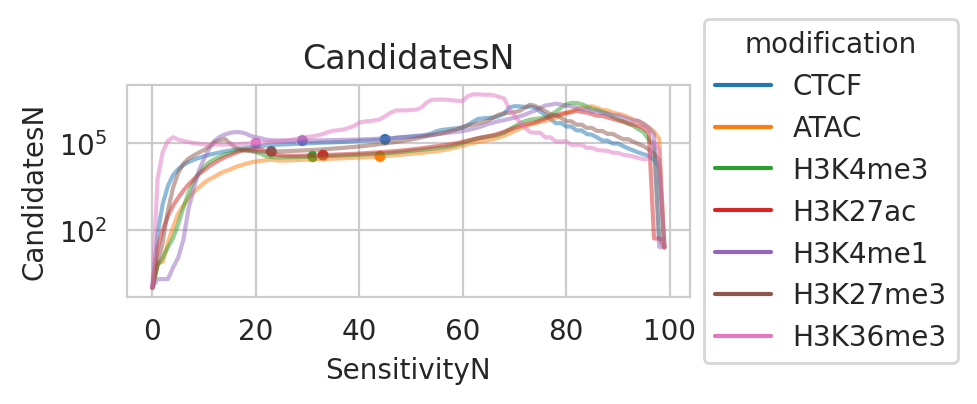

CandidatesAL


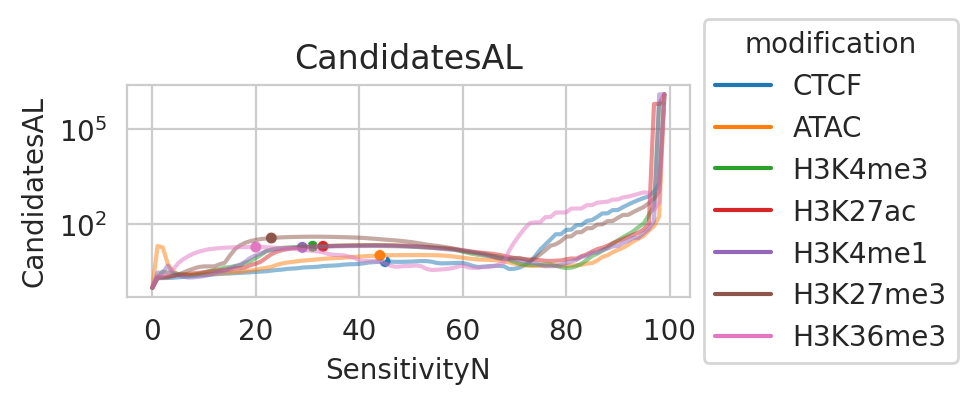

CandidatesFootprint


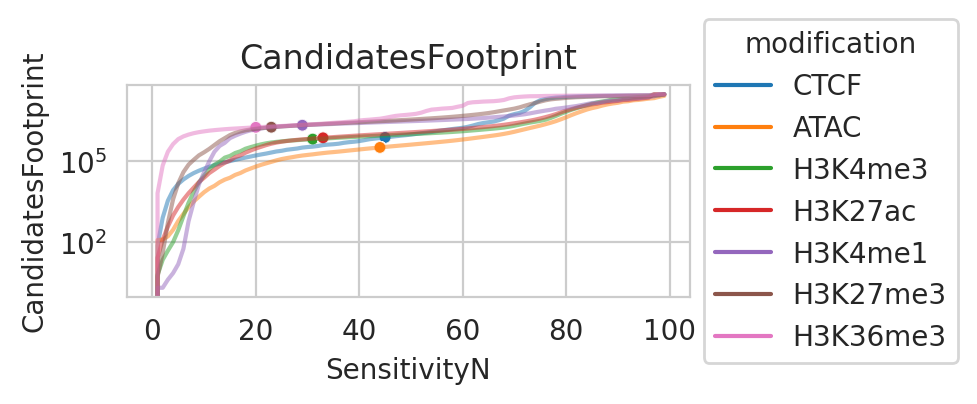

SignalNoiseRatio


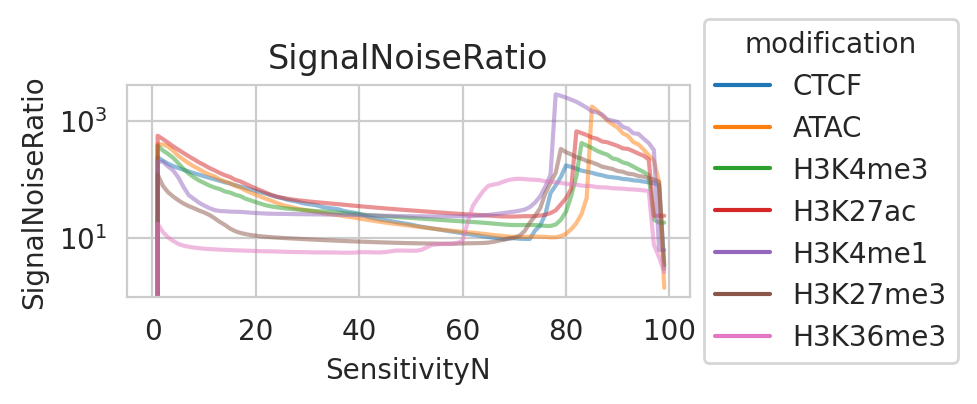

In [29]:
for y in ['CandidatesN', 'CandidatesAL', 'CandidatesFootprint', 'SignalNoiseRatio']:
    print(y)
    plt.figure(figsize=(5, 2))
    ax = plt.axes()
    sns.lineplot(data=t, x='SensitivityN', y=y, hue='modification',
                 hue_order=MODIFICATIONS_ALL,
                 alpha=0.5,
                 sort=False,
                 estimator=None,
                 ax=ax)
    if y == 'CandidatesN':
        sns.scatterplot(data=t, x='S2N', y='S2CN',
                        hue='modification',
                        hue_order=MODIFICATIONS_ALL,
                        alpha=0.8, size=50, legend=False,
                        ax=ax)
    elif y == 'CandidatesAL':
        sns.scatterplot(data=t, x='S2N', y='S2CAL',
                        hue='modification',
                        hue_order=MODIFICATIONS_ALL,
                        alpha=0.8, size=50, legend=False,
                        ax=ax)
    elif y == 'CandidatesFootprint':
        sns.scatterplot(data=t, x='S2N', y='S2CFT',
                        hue='modification',
                        hue_order=MODIFICATIONS_ALL,
                        alpha=0.8, size=50, legend=False,
                        ax=ax)

    ax.set(yscale='log')
    ax.set_title(y)
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()


# Fragmentation

In [30]:
ts = []
for (ds, m, c, r), t in full_sensitivity.groupby(['dataset', 'modification', 'cell', 'replicate']):
    if len(t['file'].unique()) != 1:
        continue
    gaps = t['file'].values[0].replace('.sensitivity.tsv', '.gaps.tsv')
    if not os.path.exists(gaps):
        continue
    # print(ds, m, c, r, gaps)
    t = pd.read_csv(gaps, sep='\t')
    t['dataset'] = ds
    t['modification'] = m
    t['cell'] = c
    t['replicate'] = r
    t['Fragmentation'] = t['CandidatesN'] / np.max(t['CandidatesN'])
    ts.append(t)
gaps_df = pd.concat(ts).reset_index(drop=True)
del ts
gaps_df.sample(5)

,Gap,CandidatesN,dataset,modification,cell,replicate,Fragmentation
383,33,21816,ABF,H3K27ac,,OD16,0.837306
13632,32,19121,ENCODE,H3K4me3,H1,rep2,0.904622
8181,31,22840,ABF,H3K4me3,,OD20,0.869234
2661,11,33668,ABF,H3K27me3,,OD3,0.823561
22320,20,65862,ImmGen,ATAC,Thymus_DP_Thymocytes,SRR8186435,0.858696


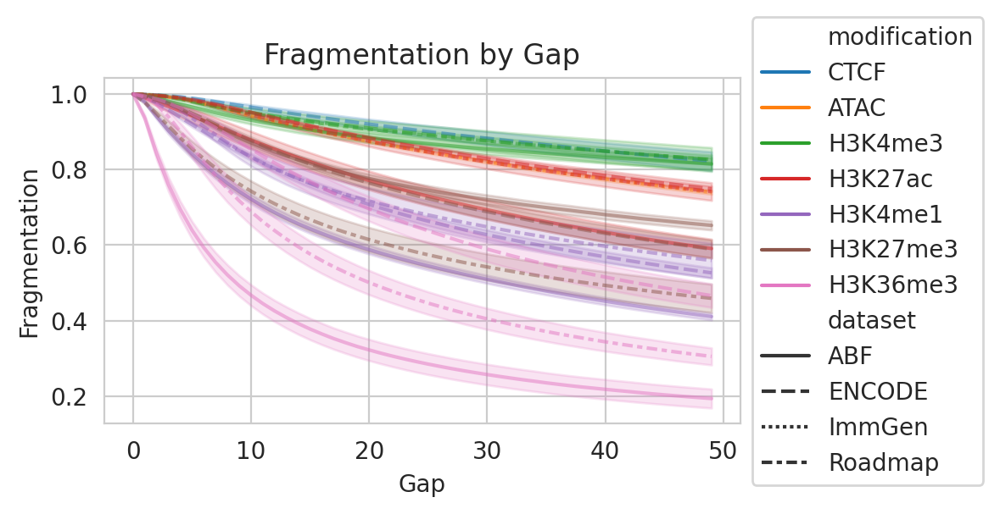

In [31]:
plt.figure(figsize=(6, 3))
ax = plt.axes()
sns.lineplot(gaps_df,
             x='Gap', y='Fragmentation',
             hue='modification',
             hue_order=MODIFICATIONS_ALL,
             style='dataset',
             errorbar='se',
             alpha=0.5,
             ax=ax)
ax.set_xlabel('Gap')
ax.set_ylabel('Fragmentation')
ax.set_title('Fragmentation by Gap')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [32]:
rows = []
for (ds, m, c, r), dft in gaps_df.groupby(['dataset', 'modification', 'cell', 'replicate']):
    fragmentation_area = (1 - dft['Fragmentation']).sum()
    rows.append((ds, m, c, r, fragmentation_area))
df_fragmentation_areas = pd.DataFrame(rows,
                                      columns=['dataset', 'modification', 'cell', 'replicate', 'fragmentation_area'])

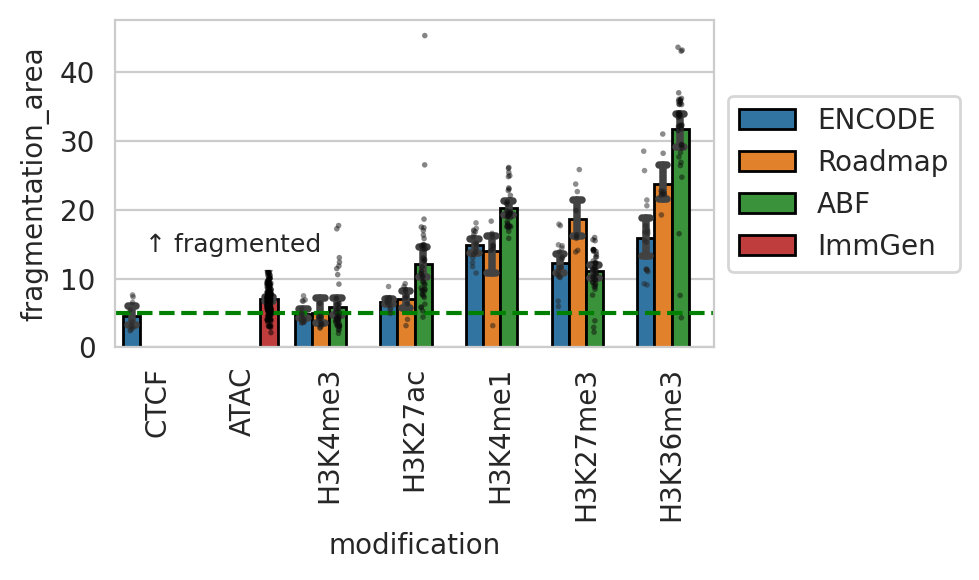

In [33]:
sns.set_style('whitegrid')
plt.figure(figsize=(5, 3))
ax = plt.axes()
t = df_peaks

sns.barplot(data=df_fragmentation_areas, x='modification', y='fragmentation_area', hue='dataset',
            capsize=.1, edgecolor="black",
            order=MODIFICATIONS_ALL,
            hue_order=DATASETS,
            ax=ax)
sns.stripplot(data=df_fragmentation_areas, x='modification', y='fragmentation_area', hue='dataset',
              dodge=True, size=2, palette='dark:black', alpha=0.5,
              order=MODIFICATIONS_ALL,
              hue_order=DATASETS, legend=False,
              ax=ax)
ax.xaxis.set_tick_params(rotation=90)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# 500bp gap
ax.axhline(y=5, xmin=0, xmax=6, color='green', ls='dashed')
ax.text(0.05, 0.35, "↑ fragmented",
        transform=ax.transAxes, fontsize=9,
        verticalalignment='top', bbox=dict(facecolor='white', alpha=1))
plt.tight_layout()
plt.show()

# Autocorrelations

## Coverage

In [34]:
ts = []
for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        print(ds, m)
        dfdsm = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                                 (full_sensitivity['modification'] == m)]
        for (cell, rep), t in dfdsm.groupby(['cell', 'replicate']):
            if len(t['file'].unique()) != 1:
                continue
            corrs = t['file'].values[0].replace('.sensitivity.tsv', '.ac.coverage.tsv')
            if not os.path.exists(corrs):
                continue
            t = pd.read_csv(corrs, sep='\t')
            t['dataset'] = ds
            t['modification'] = m
            t['cell'] = cell
            t['replicate'] = rep
            ts.append(t)
ac_cov_df = pd.concat(ts).reset_index(drop=True)
del ts
ac_cov_df.sample(5)

ENCODE CTCF
Roadmap CTCF
ABF CTCF
ImmGen CTCF
ENCODE ATAC
Roadmap ATAC
ABF ATAC
ImmGen ATAC
ENCODE H3K4me3
Roadmap H3K4me3
ABF H3K4me3
ImmGen H3K4me3
ENCODE H3K27ac
Roadmap H3K27ac
ABF H3K27ac
ImmGen H3K27ac
ENCODE H3K4me1
Roadmap H3K4me1
ABF H3K4me1
ImmGen H3K4me1
ENCODE H3K27me3
Roadmap H3K27me3
ABF H3K27me3
ImmGen H3K27me3
ENCODE H3K36me3
Roadmap H3K36me3
ABF H3K36me3
ImmGen H3K36me3


,D,Correlation,dataset,modification,cell,replicate
20095,2,0.220717,ENCODE,H3K27me3,HepG2,rep2
21334,17,0.444477,ABF,H3K27me3,,OD15
22146,13,0.022880,ABF,H3K27me3,,YD11
7444,50,0.015627,ImmGen,ATAC,Spleen_NKT_Cell,SRR5799476
11329,8,0.151469,ABF,H3K4me3,,OD1


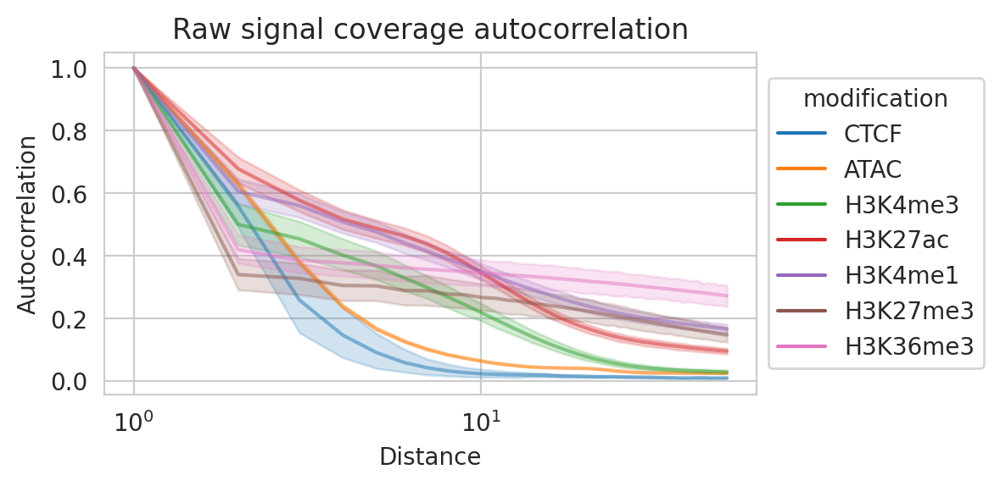

In [35]:
plt.figure(figsize=(6, 3))
ax = plt.axes()
sns.lineplot(ac_cov_df[ac_cov_df['D'] <= 200],
             x='D', y='Correlation',
             hue='modification',
             hue_order=MODIFICATIONS_ALL,
             alpha=0.5,
             ax=ax)
ax.set_xlabel('Distance')
ax.set_ylabel('Autocorrelation')
ax.set_title('Raw signal coverage autocorrelation')
ax.set(xscale='log')
# ax.invert_xaxis()
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

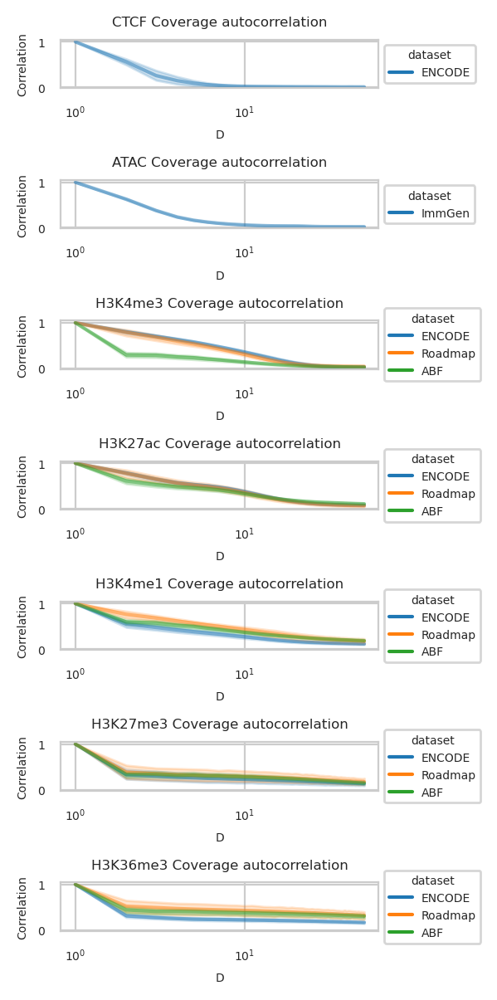

In [36]:
plt.rc('font', size=5)
plt.figure(figsize=(3, 6))
axs = [plt.subplot(7, 1, i + 1) for i in range(7)]
ymin = np.min(ac_cov_df['Correlation'])
for i, m in enumerate(MODIFICATIONS_ALL):
    t = ac_cov_df[ac_cov_df['modification'] == m]
    if len(t) == 0:
        continue
    ax = axs[i]
    sns.lineplot(t,
                 x='D', y='Correlation',
                 hue='dataset',
                 alpha=0.5,
                 ax=ax)
    ax.set_title(f'{m} Coverage autocorrelation')
    ax.set(xscale='log')
    ax.set_ylim(bottom=ymin)
    # ax.invert_xaxis()
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()
plt.rc('font', size=8)

## PEPs

In [37]:
ts = []
for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        print(ds, m)
        dfdsm = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                                 (full_sensitivity['modification'] == m)]
        for (cell, rep), t in dfdsm.groupby(['cell', 'replicate']):
            if len(t['file'].unique()) != 1:
                continue
            corrs = t['file'].values[0].replace('.sensitivity.tsv', '.ac.pvals.tsv')
            if not os.path.exists(corrs):
                continue
            t = pd.read_csv(corrs, sep='\t')
            t['dataset'] = ds
            t['modification'] = m
            t['cell'] = cell
            t['replicate'] = rep
            ts.append(t)
ac_pvals_df = pd.concat(ts).reset_index(drop=True)
del ts
ac_pvals_df.sample(5)

ENCODE CTCF
Roadmap CTCF
ABF CTCF
ImmGen CTCF
ENCODE ATAC
Roadmap ATAC
ABF ATAC
ImmGen ATAC
ENCODE H3K4me3
Roadmap H3K4me3
ABF H3K4me3
ImmGen H3K4me3
ENCODE H3K27ac
Roadmap H3K27ac
ABF H3K27ac
ImmGen H3K27ac
ENCODE H3K4me1
Roadmap H3K4me1
ABF H3K4me1
ImmGen H3K4me1
ENCODE H3K27me3
Roadmap H3K27me3
ABF H3K27me3
ImmGen H3K27me3
ENCODE H3K36me3
Roadmap H3K36me3
ABF H3K36me3
ImmGen H3K36me3


,D,Correlation,dataset,modification,cell,replicate
12552,7,0.593554,ABF,H3K4me3,,YD14
4810,17,0.019816,ImmGen,ATAC,Spleen_B_Cell,SRR5799457
1292,18,0.087289,ImmGen,ATAC,Bone_marrow_B_Cell,SRR5799471
10123,26,0.049153,ENCODE,H3K4me3,HMEC,rep1
7779,28,0.011312,ImmGen,ATAC,Spleen_NK_Cell,SRR5799410


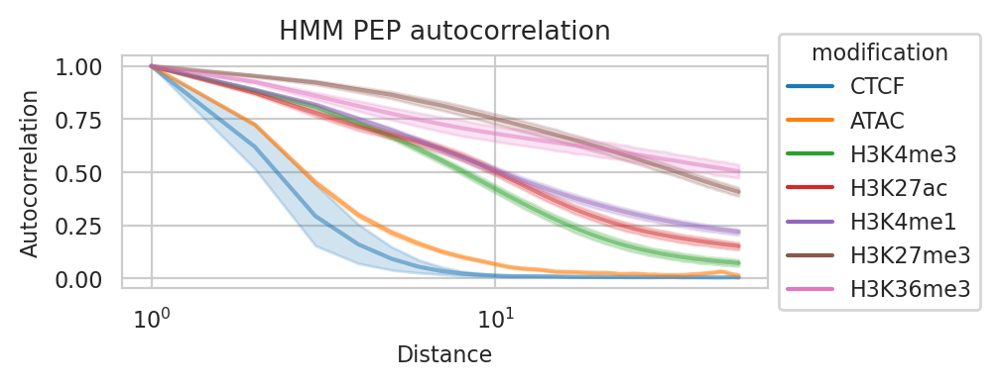

In [38]:
plt.figure(figsize=(5, 2))
ax = plt.axes()
sns.lineplot(ac_pvals_df[ac_pvals_df['D'] <= 200],
             x='D', y='Correlation',
             hue='modification',
             hue_order=MODIFICATIONS_ALL,
             alpha=0.5,  #errorbar=('se', .95),
             ax=ax)
ax.set_xlabel('Distance')
ax.set_ylabel('Autocorrelation')
ax.set_title('HMM PEP autocorrelation')
ax.set(xscale='log')
# ax.invert_xaxis()
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

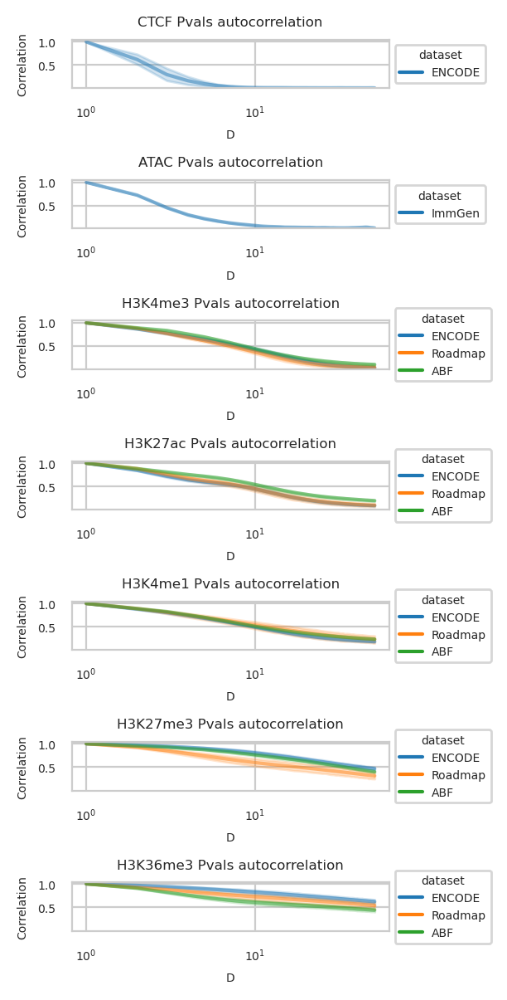

In [39]:
plt.rc('font', size=5)
plt.figure(figsize=(3, 6))
axs = [plt.subplot(7, 1, i + 1) for i in range(7)]
ymin = np.min(ac_pvals_df['Correlation'])
for i, m in enumerate(MODIFICATIONS_ALL):
    t = ac_pvals_df[ac_pvals_df['modification'] == m]
    if len(t) == 0:
        continue
    ax = axs[i]
    sns.lineplot(t,
                 x='D', y='Correlation',
                 hue='dataset',
                 alpha=0.5,  #errorbar=('se', .95),
                 ax=ax)
    ax.set_ylim(bottom=ymin)
    ax.set_title(f'{m} Pvals autocorrelation')
    ax.set(xscale='log')
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()
plt.rc('font', size=8)

# Candidates

In [40]:
cns = {}
cals = {}
for (ds, m, c, r), t in full_sensitivity.groupby(['dataset', 'modification', 'cell', 'replicate']):
    tt = t.sort_values('Sensitivity').reset_index(drop=True)
    name = f'{ds} {m} {c} {r}'
    sp = sps[name]
    cn = tt['CandidatesN'].values[sp[1]]
    cal = tt['CandidatesAL'].values[sp[1]]
    cns[(ds, m, c, r)] = cn
    cals[(ds, m, c, r)] = cal

full_infos['candidatesN'] = [cns[(ds, m, c, r)] if (ds, m, c, r) in cns else 0 for _, (ds, m, c, r) in
                             full_infos[['dataset', 'modification', 'cell', 'replicate']].iterrows()]
full_infos['candidatesAL'] = [cals[(ds, m, c, r)] if (ds, m, c, r) in cals else 0 for _, (ds, m, c, r) in
                              full_infos[['dataset', 'modification', 'cell', 'replicate']].iterrows()]
full_infos.sample(3)

,file,modification,cell,replicate,peaks,length_mean,length_median,model_signal,model_noise,model_signal_to_noise,...,signal_density,noise_density,signal_to_noise,signal_to_control,fit_snr_adjusted,fit_low_adjusted,dataset,outlier,candidatesN,candidatesAL
414,/home/jetbrains/data/2018_chipseq_y20o20/omnip...,H3K27ac,,YD3,19184.0,1740.0,1205.0,5.734983,1.174361,4.883491,...,0.058389,0.011518,5.069530,1.0,False,True,ABF,False,22465,20.886530
240,/home/jetbrains/data/2024_Immgen/omnipeak/SRR5...,ATAC,Spleen_CD8_T_Cell,SRR5799443,29978.0,439.0,285.0,5.238030,0.392020,13.361656,...,0.050606,0.002412,20.976802,NaN,False,False,Immgen,False,0,0.000000
55,/home/jetbrains/data/2023_GSE26320/omnipeak/GS...,H3K27ac,NHLF,rep1,44597.0,1584.0,1030.0,3.284024,0.300000,10.946747,...,0.036716,0.001377,26.658552,1.0,True,False,ENCODE,False,46991,22.727304


In [41]:
# Remove outliers
OUTLIERS = [
    ('H3K4me3', 'NK', ''),
    ('H3K27me3', 'TCell', ''),
    ('H3K27me3', 'BCell', ''),
]
df_peaks = full_infos.loc[[(m, c, r) not in OUTLIERS
                           for _, (m, c, r) in full_infos[['modification', 'cell', 'replicate']].iterrows()]].copy()

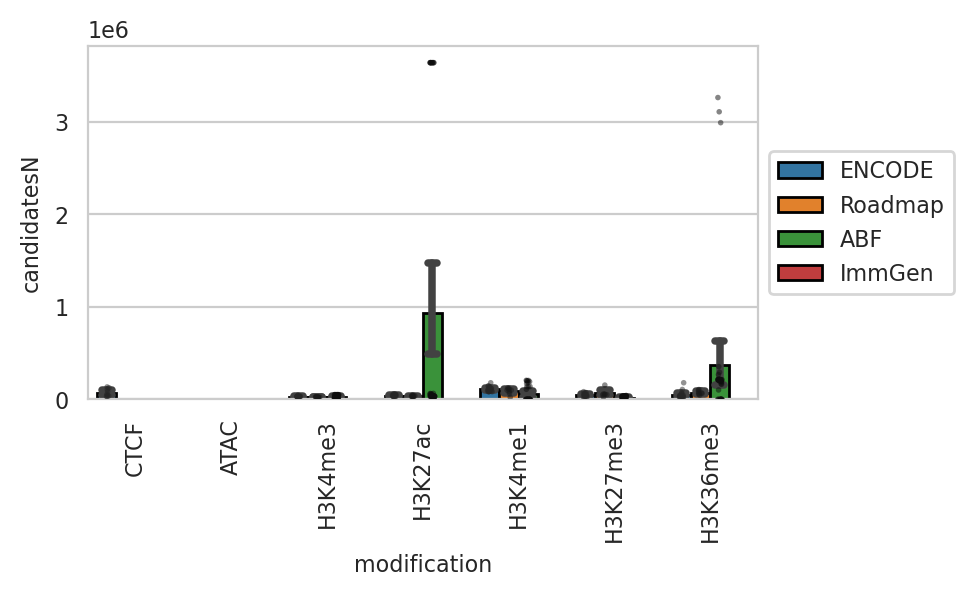

In [42]:
sns.set_style('whitegrid')
plt.figure(figsize=(5, 3))
ax = plt.axes()
t = df_peaks
sns.barplot(data=t, x='modification', y='candidatesN', hue='dataset',
            capsize=.1, edgecolor="black",
            order=MODIFICATIONS_ALL,
            hue_order=DATASETS,
            ax=ax)
sns.stripplot(data=t, x='modification', y='candidatesN', hue='dataset',
              dodge=True, size=2, palette='dark:black', alpha=0.5,
              order=MODIFICATIONS_ALL,
              hue_order=DATASETS, legend=False,
              ax=ax)
ax.xaxis.set_tick_params(rotation=90)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [43]:
full_infos[(full_infos['modification'] == 'H3K27me3')].sort_values(by=['candidatesN'], ascending=False)[
    ['cell', 'replicate', 'candidatesN']].head(10)

,cell,replicate,candidatesN
108,TCell,,249099
117,BCell,,190777
115,NK,,155139
46,Huvec,rep2,84059
3,GM12878,rep1,73496
35,K562,rep2,70838
94,CD34,,60410
28,HSMM,rep2,58192
85,PBMC,,56396
2,NHLF,rep2,55943


# PEPs (pvals)

In [44]:
ts = []
for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        print(ds, m)
        dfdsm = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                                 (full_sensitivity['modification'] == m)]
        for (cell, rep), t in dfdsm.groupby(['cell', 'replicate']):
            if len(t['file'].unique()) != 1:
                continue
            pvals = t['file'].values[0].replace('.sensitivity.tsv', '.logps.tsv')
            if not os.path.exists(pvals):
                continue
            t = pd.read_csv(pvals, sep='\t')
            t['dataset'] = ds
            t['modification'] = m
            t['cell'] = cell
            t['replicate'] = rep
            ts.append(t)
pvals_df = pd.concat(ts).reset_index(drop=True)
del ts
pvals_df.sample(5)

ENCODE CTCF
Roadmap CTCF
ABF CTCF
ImmGen CTCF
ENCODE ATAC
Roadmap ATAC
ABF ATAC
ImmGen ATAC
ENCODE H3K4me3
Roadmap H3K4me3
ABF H3K4me3
ImmGen H3K4me3
ENCODE H3K27ac
Roadmap H3K27ac
ABF H3K27ac
ImmGen H3K27ac
ENCODE H3K4me1
Roadmap H3K4me1
ABF H3K4me1
ImmGen H3K4me1
ENCODE H3K27me3
Roadmap H3K27me3
ABF H3K27me3
ImmGen H3K27me3
ENCODE H3K36me3
Roadmap H3K36me3
ABF H3K36me3
ImmGen H3K36me3


,Q,LogNullP,dataset,modification,cell,replicate
244390,0.00146,-16.378859,ABF,H3K4me3,,YD11
163940,0.00777,-0.470175,ImmGen,ATAC,Thymus_CD4_SP_Thymocytes,SRR5799395
52539,0.00487,-0.423785,ImmGen,ATAC,Peritoneal_cavity_B_Cell,SRR5799461
345669,0.00324,-66.490646,Roadmap,H3K4me1,BCell,
412918,0.00506,-15.252786,ABF,H3K27me3,,OD1


## Examples

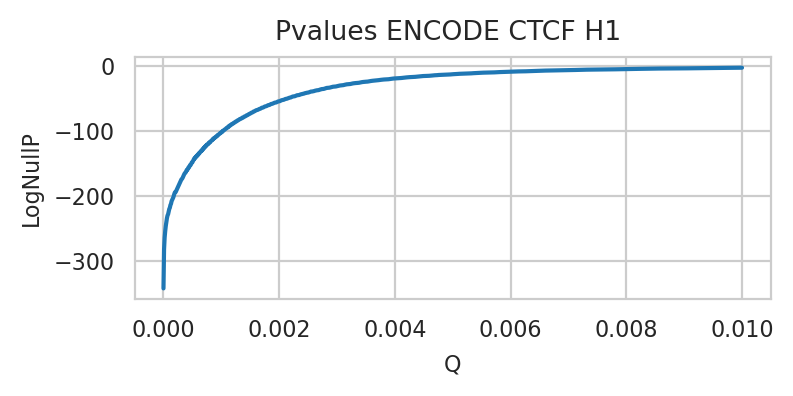

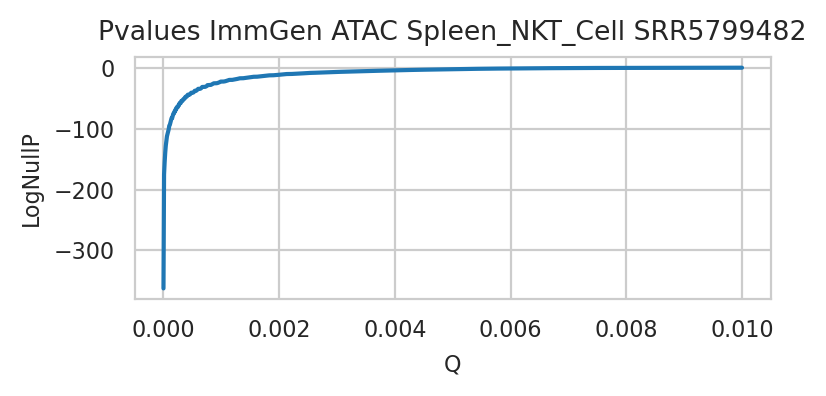

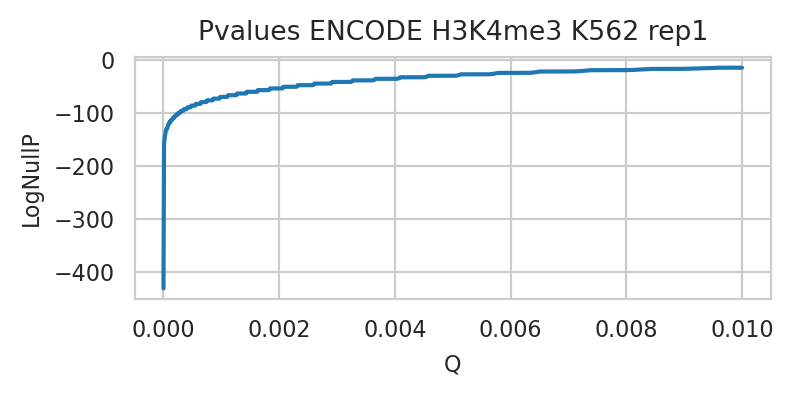

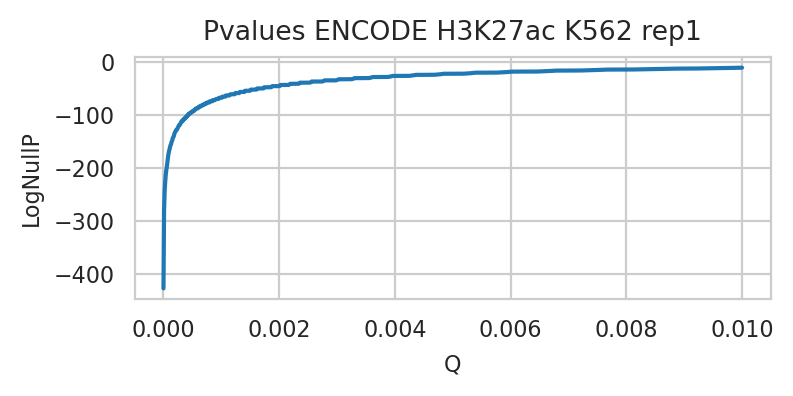

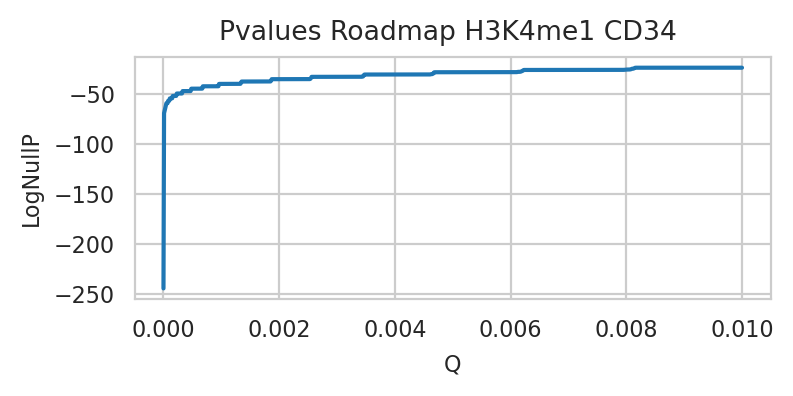

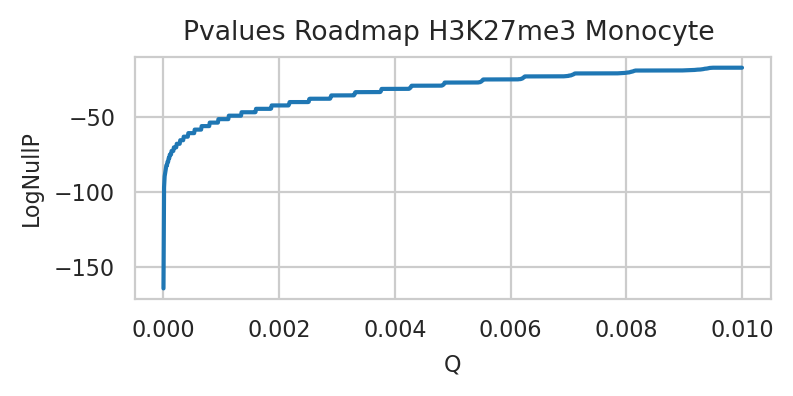

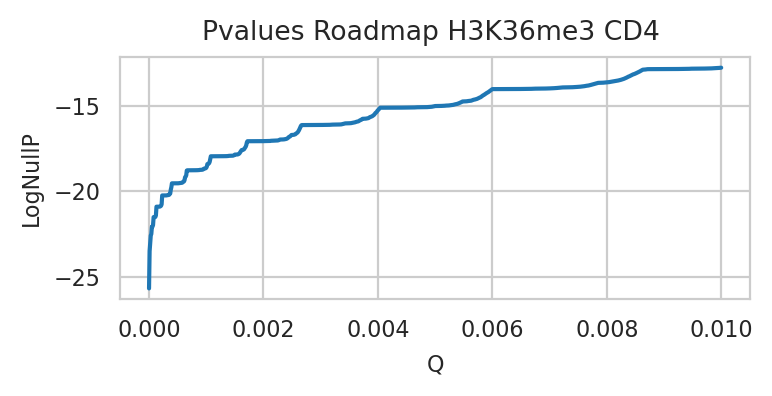

In [45]:
for (m, c, r, ds) in EXAMPLES:
    t = pvals_df[(pvals_df['dataset'] == ds) &
                 (pvals_df['modification'] == m) &
                 (pvals_df['cell'] == c) &
                 (pvals_df['replicate'] == r)].copy().reset_index(drop=True)
    if len(t) == 0:
        continue
    name = f'{ds} {m} {c} {r}'
    plt.figure(figsize=(4, 2))
    ax = plt.axes()
    sns.lineplot(t,
                 x='Q', y='LogNullP', estimator=None,
                 ax=ax)
    ax.set_title(f'Pvalues {name}')
    plt.tight_layout()
    plt.show()

## All

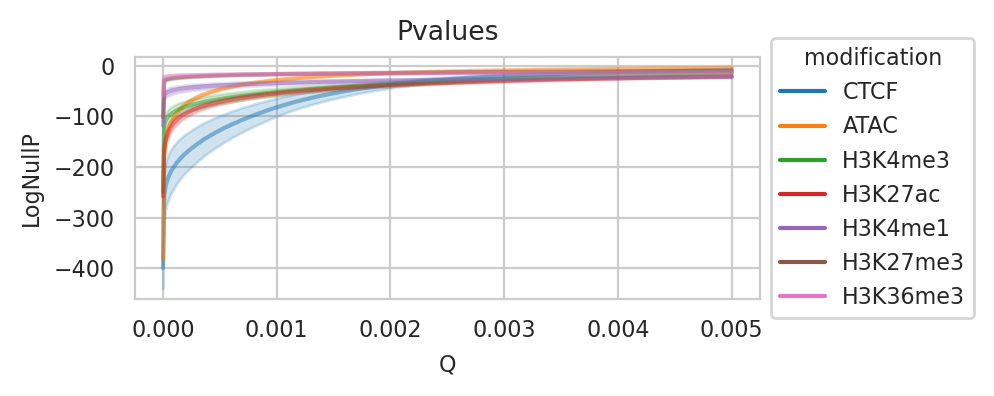

In [46]:
pvals_df['MinusLogNullP'] = -pvals_df['LogNullP']
plt.figure(figsize=(5, 2))
ax = plt.axes()
sns.lineplot(pvals_df[pvals_df['Q'] <= 0.005],
             x='Q', y='LogNullP',
             hue='modification',
             hue_order=MODIFICATIONS_ALL,
             alpha=0.5, errorbar=('se', .95),
             ax=ax)
ax.set_title('Pvalues')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

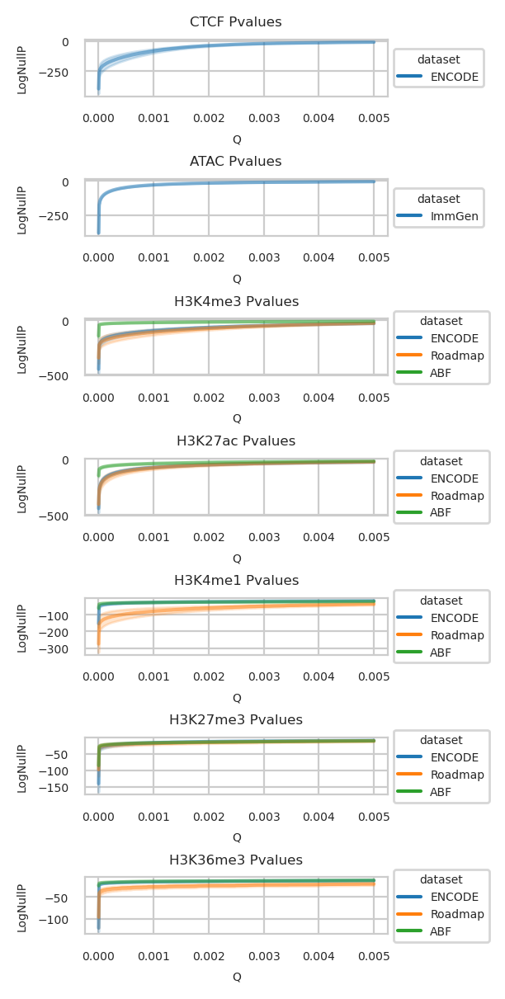

In [47]:
plt.rc('font', size=5)
plt.figure(figsize=(3, 6))
axs = [plt.subplot(7, 1, i + 1) for i in range(7)]
for i, m in enumerate(MODIFICATIONS_ALL):
    ax = axs[i]
    sns.lineplot(pvals_df[(pvals_df['modification'] == m) & (pvals_df['dataset'] != '') & (pvals_df['Q'] <= 0.005)],
                 x='Q', y='LogNullP',
                 hue='dataset',
                 alpha=0.5, errorbar=('se', .95),
                 ax=ax)
    ax.set_title(f'{m} Pvalues')
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()
plt.rc('font', size=8)

# Summary

In [48]:
full_infos['effective_coverage'] = full_infos['coverage'] - full_infos['beta'] * full_infos['control_coverage'] * \
                                   full_infos['control_scale']

In [49]:
features = [
    'model_signal',
    'model_noise',
    'model_signal_to_noise',
    'log_null_pvals_mean',
    'log_null_pvals_std',
    'coverage',
    'control_coverage',
    'control_scale',
    'beta',
    'min_correlation',
    'coverage_non_zero',
    'coverage_max',
    'coverage_mean',
    'coverage_median',
    'coverage_std',
    'signal_density',
    'noise_density',
    'signal_to_noise',
    'autocorrelation_average_score',
]

full_features = features

In [50]:
full_infos[(full_infos['modification'] == 'H3K27ac') &
           (full_infos['cell'].isin(['CD4']))][['modification', 'cell'] + full_features].T

,103,107
modification,H3K27ac,H3K27ac
cell,CD4,CD4
model_signal,5.859428,5.93036
model_noise,0.454319,0.493623
model_signal_to_noise,12.897158,12.013948
log_null_pvals_mean,-0.59534,-0.210654
log_null_pvals_std,5.326327,3.023195
coverage,14516186.0,12359870.0
control_coverage,42504323.0,42504338.0
control_scale,0.341523,0.290791


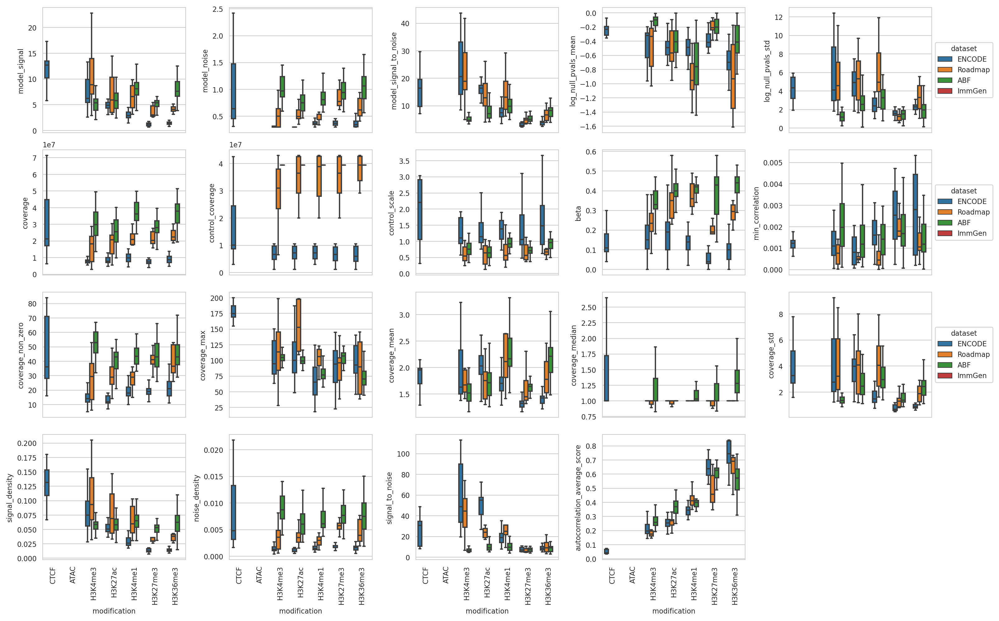

In [51]:
ncols = int(math.ceil(math.sqrt(len(full_features) + 3)))
nrows = int(math.ceil(len(full_features) / ncols))
plt.figure(figsize=(3.2 * ncols, 2.5 * nrows))
axs = [plt.subplot(nrows, ncols, i + 1) for i in range(len(full_features))]
for i, y in enumerate(full_features):
    ax = axs[i]
    sns.boxplot(data=full_infos, x='modification', y=y,
                hue='dataset',
                hue_order=DATASETS,
                order=MODIFICATIONS_ALL,
                showfliers=False,
                ax=ax)
    ax.xaxis.set_tick_params(rotation=90)
    if i < (nrows - 1) * ncols:
        ax.set_xlabel(None)
        ax.set_xticks([], minor=False)
        ax.set_xticklabels([])
    ax.xaxis.set_tick_params(rotation=90)
    if i % ncols == ncols - 1:
        sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    else:
        ax.legend().set_visible(False)
plt.tight_layout()
plt.show()

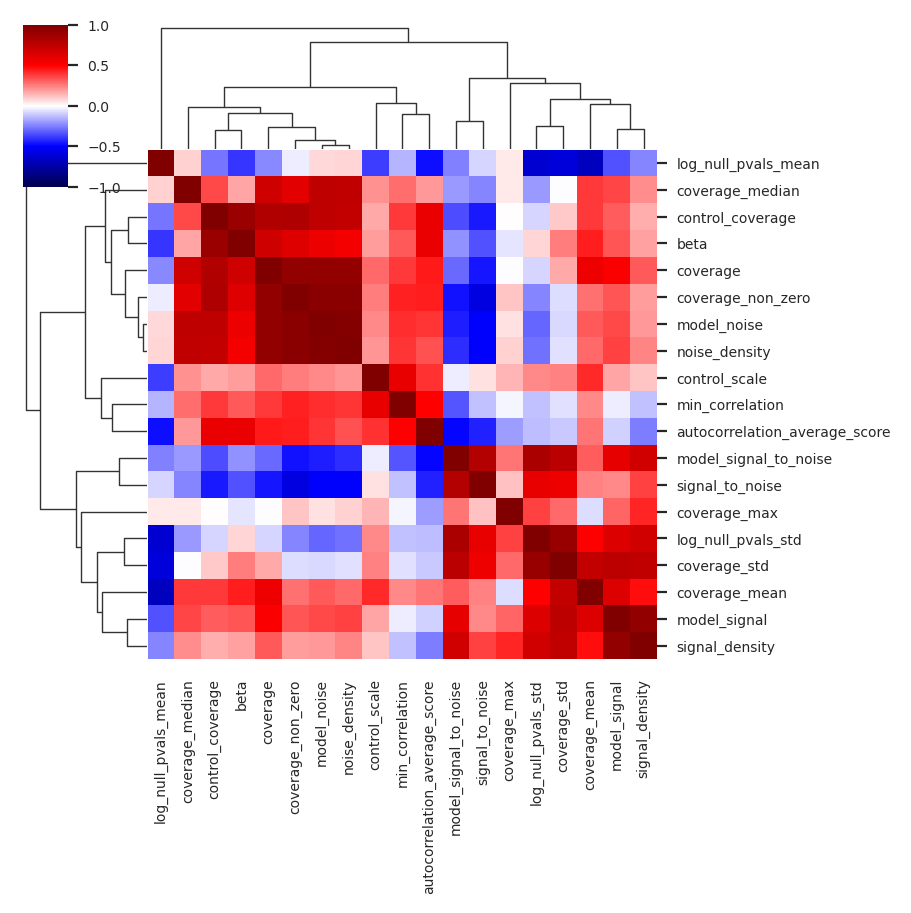

In [52]:
full_infos.fillna(0, inplace=True)
corrs = full_infos[full_features].corr(method='pearson').fillna(0)
plt.rc('font', size=5)
sns.clustermap(corrs,
               col_cluster=True, row_cluster=True,
               figsize=(4.5, 4.5),
               cmap=plt.cm.seismic,
               vmin=-1, vmax=1)
plt.show()
plt.rc('font', size=8)

# Segments

In [53]:
import matplotlib.patches as mpatches


def plot_segments(sdf, df, name, sp=None, ax=None, legend=True):
    sdf['New %'] = [d(n, t) * 100 for n, t in zip(sdf['New'], sdf['CandidatesN'])]
    sdf['Total %'] = 100
    axisnone = ax is None
    if ax is None:
        plt.figure(figsize=(8, 2))
        ax = plt.axes()
    # Background
    xs = list(range(len(sdf)))
    sns.barplot(x=xs, y=sdf['Total %'],
                color='orange',
                alpha=0.5,
                ax=ax)
    # Foreground
    sns.barplot(x=xs, y=sdf['New %'],
                color='blue',
                alpha=0.5,
                ax=ax)
    if df is not None:
        assert len(sdf) == len(df)
        df = df.sort_values(by=['Sensitivity'])
        ns = np.log1p(df['CandidatesN'])
        ns = ns * 80 / ns.max() + 10
        sns.lineplot(x=xs, y=ns,
                     color='black',
                     sort=False,
                     estimator=None,
                     ax=ax)
        als = np.log1p(df['CandidatesAL'])
        als = als * 80 / als.max() + 10
        sns.lineplot(x=xs, y=als,
                     color='brown',
                     sort=False,
                     estimator=None,
                     ax=ax)

    ax.set_title(name)
    ax.set_ylabel('peaks %')

    sens = np.array(sorted(sdf['Sensitivity']))
    tens_closest = {np.argmin(np.fabs(sens - x)): x for x in [-100, -10, -1, -0.1, -1e-2, -1e-3, -1e-4, -1e-6]}
    labels = [str(tens_closest[i]) if i in tens_closest else '' for i in range(len(ax.get_xticklabels()))]
    ax.set_xticklabels(labels)
    ax.set_xlabel('Sensitivity')
    for i in tens_closest.keys():
        ax.axvline(x=i, ymin=0, ymax=90, color='grey', lw=0.5)

    # Points
    if sp is not None:
        ax.axvline(x=sp[2], ymin=0, ymax=90, color='blue', lw=2)
        ax.axvline(x=sp[1], ymin=0, ymax=90, color='red', lw=2)
        ax.axvline(x=sp[0], ymin=0, ymax=90, color='green', lw=2)

    # add legend
    if legend:
        top_bar = mpatches.Patch(color='orange', label='old %')
        bottom_bar = mpatches.Patch(color='blue', label='new %')
        ns = mpatches.Patch(color='black', label='number')
        if df is None:
            plt.legend(handles=[bottom_bar, top_bar, ns])
        else:
            als = mpatches.Patch(color='brown', label='avglen')
            plt.legend(handles=[bottom_bar, top_bar, ns, als])
        sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))

    new_value = 1
    for patch in ax.patches:
        current_width = patch.get_width()
        diff = current_width - new_value
        # we change the bar width
        patch.set_width(new_value)
        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)
    if axisnone:
        plt.tight_layout()
        plt.show()

## Examples

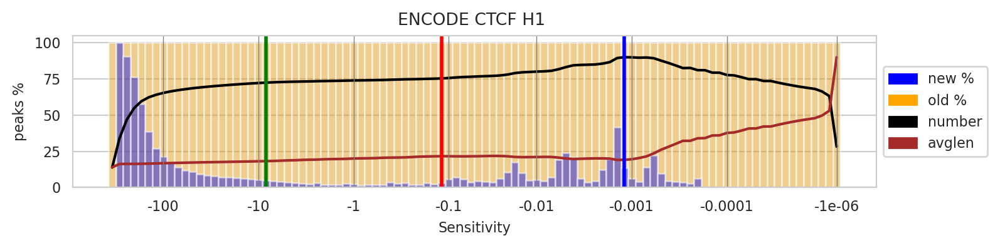

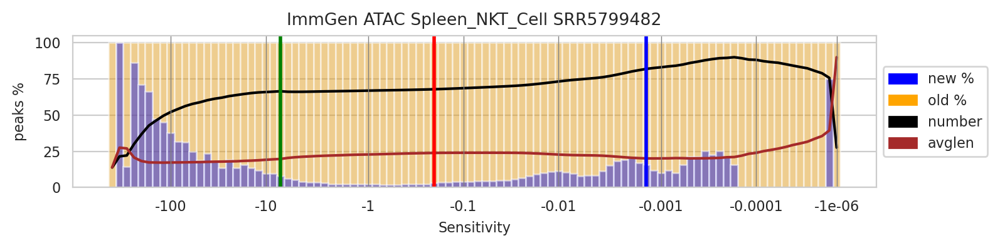

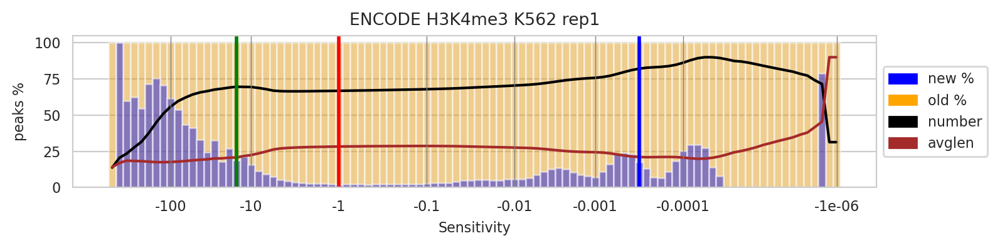

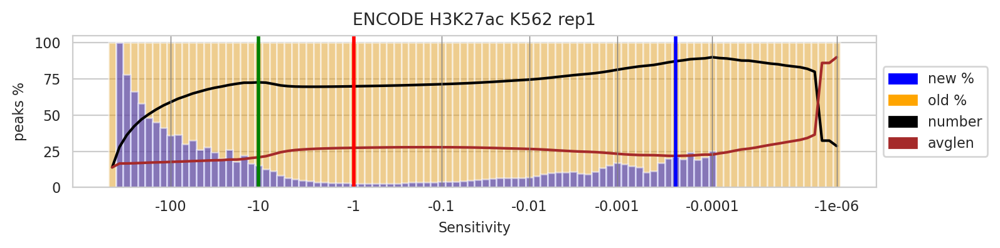

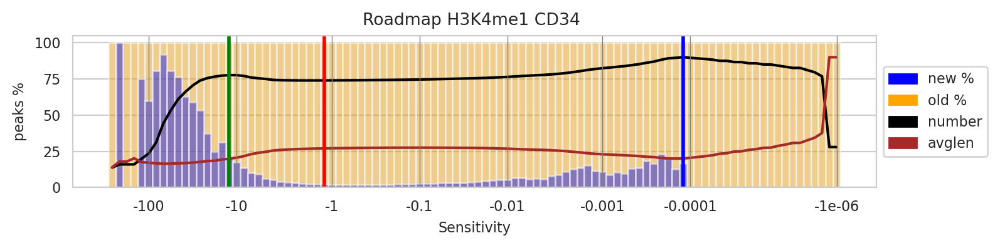

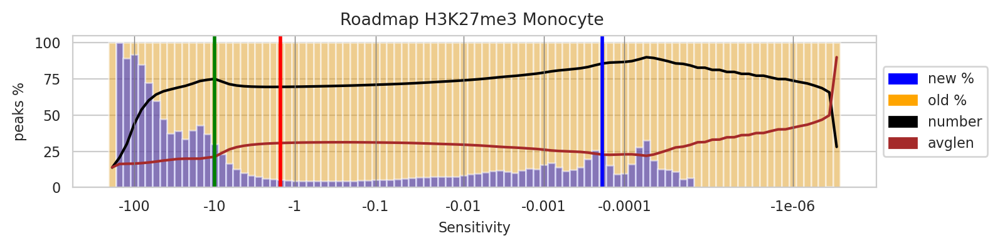

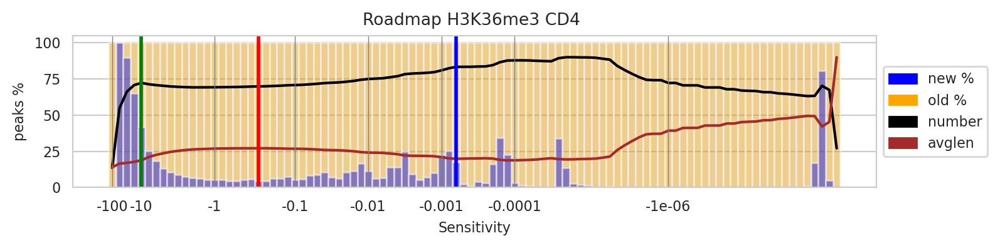

In [54]:
for (m, c, r, ds) in EXAMPLES:
    t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                         (full_sensitivity['modification'] == m) &
                         (full_sensitivity['cell'] == c) &
                         (full_sensitivity['replicate'] == r)]
    if len(t['file'].unique()) != 1:
        continue
    segments = t['file'].values[0].replace('.sensitivity.tsv', '.segments.tsv')
    if not os.path.exists(segments):
        continue
    sdf = pd.read_csv(segments, sep='\t')
    name = f'{ds} {m} {c} {r}'
    sp = sps[name] if name in sps else None
    plot_segments(sdf, t, name, sp)

## Per modification

In [55]:
ts = []
for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        print(ds, m)
        dfdsm = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                                 (full_sensitivity['modification'] == m)]
        for (cell, rep), t in dfdsm.groupby(['cell', 'replicate']):
            if len(t['file'].unique()) != 1:
                continue
            segments = t['file'].values[0].replace('.sensitivity.tsv', '.segments.tsv')
            if not os.path.exists(segments):
                continue
            sdf = pd.read_csv(segments, sep='\t')
            sdf['dataset'] = ds
            sdf['modification'] = m
            sdf['cell'] = cell
            sdf['replicate'] = rep
            sdf['SensitivityN'] = range(len(sdf))
            ts.append(sdf)
segments_df = pd.concat(ts).reset_index(drop=True)
segments_df['New %'] = [d(n, t) * 100 for n, t in zip(segments_df['New'], segments_df['CandidatesN'])]
del ts
segments_df.fillna(0, inplace=True)
segments_df.sample(5)

ENCODE CTCF
Roadmap CTCF
ABF CTCF
ImmGen CTCF
ENCODE ATAC
Roadmap ATAC
ABF ATAC
ImmGen ATAC
ENCODE H3K4me3
Roadmap H3K4me3
ABF H3K4me3
ImmGen H3K4me3
ENCODE H3K27ac
Roadmap H3K27ac
ABF H3K27ac
ImmGen H3K27ac
ENCODE H3K4me1
Roadmap H3K4me1
ABF H3K4me1
ImmGen H3K4me1
ENCODE H3K27me3
Roadmap H3K27me3
ABF H3K27me3
ImmGen H3K27me3
ENCODE H3K36me3
Roadmap H3K36me3
ABF H3K36me3
ImmGen H3K36me3


,Sensitivity,CandidatesN,New,Old,dataset,modification,cell,replicate,SensitivityN,New %
30412,-3.312382,37516,4213,33303,ABF,H3K27ac,,OD6,12,11.229875
46779,-0.000121,1446634,0,1446634,ENCODE,H3K36me3,NHLF,rep1,79,0.000000
16880,-0.000554,1113072,94076,1018996,ImmGen,ATAC,Thymus_DP_Thymocytes,SRR8186433,80,8.451924
3858,-0.028705,73899,6716,67183,ImmGen,ATAC,Bone_marrow_Stem_Cell,SRR5799538,58,9.088080
29903,-82.868413,1853,1640,213,ABF,H3K27ac,,OD2,3,88.505127


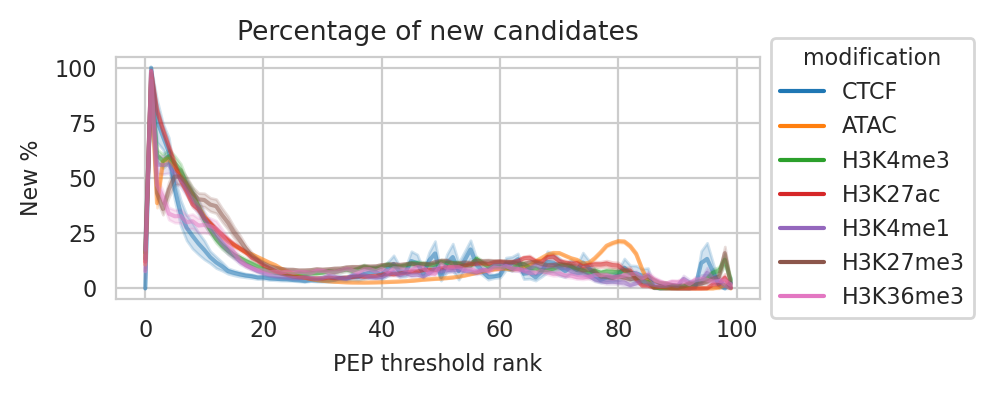

In [56]:
plt.figure(figsize=(5, 2))
ax = plt.axes()
sns.lineplot(segments_df,
             x='SensitivityN', y='New %',
             hue='modification',
             hue_order=MODIFICATIONS_ALL,
             alpha=0.5, errorbar=('se', .95),
             ax=ax)
ax.set_xlabel('PEP threshold rank')
ax.set_ylabel('New %')
ax.set_title('Percentage of new candidates')
# ax.set(xscale='log')
# ax.invert_xaxis()
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

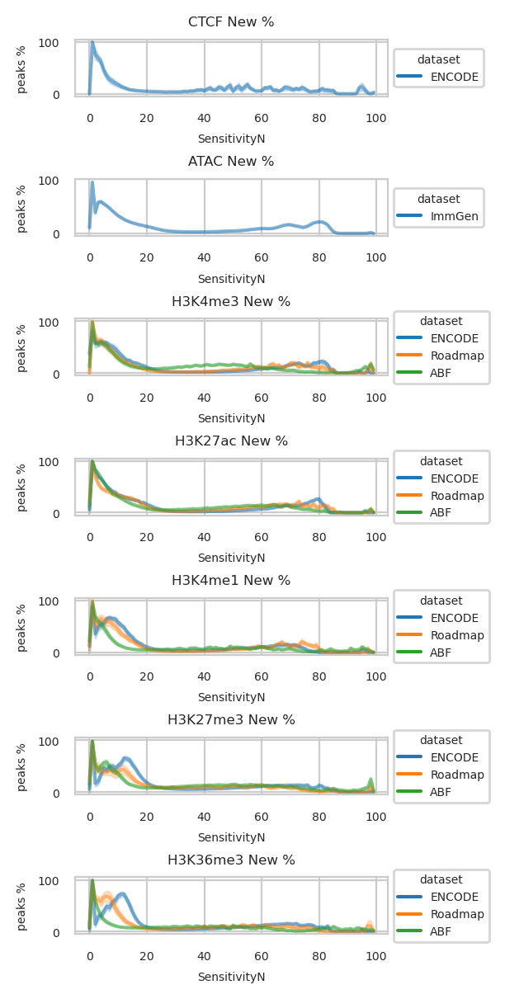

In [57]:
plt.rc('font', size=5)
plt.figure(figsize=(3, 6))
axs = [plt.subplot(7, 1, i + 1) for i in range(7)]
for i, m in enumerate(MODIFICATIONS_ALL):
    ax = axs[i]
    sns.lineplot(segments_df[segments_df['modification'] == m],
                 x='SensitivityN', y='New %',
                 hue='dataset',
                 alpha=0.5, errorbar=('se', .95),
                 ax=ax)
    ax.set_ylabel('peaks %')
    ax.set_title(f'{m} New %')
    # ax.set(xscale='log')
    # ax.invert_xaxis()
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()
plt.rc('font', size=8)

## All

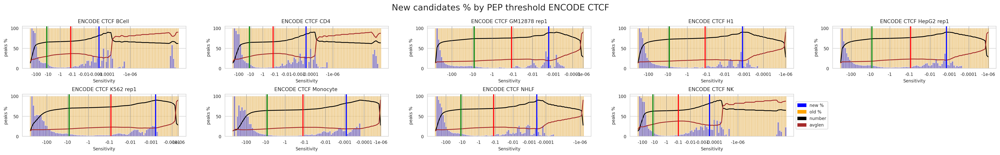

<Figure size 100x200 with 0 Axes>

<Figure size 100x200 with 0 Axes>

<Figure size 100x200 with 0 Axes>

<Figure size 100x200 with 0 Axes>

<Figure size 100x200 with 0 Axes>

<Figure size 100x200 with 0 Axes>

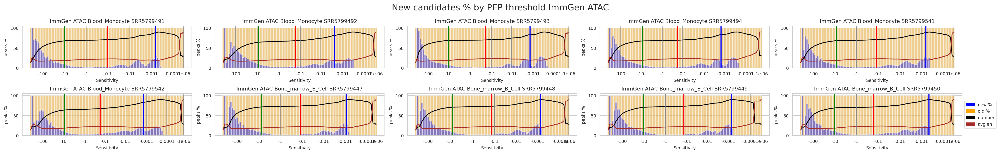

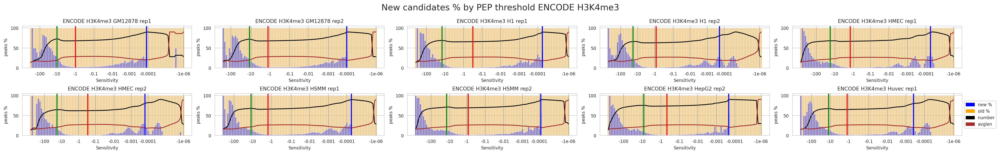

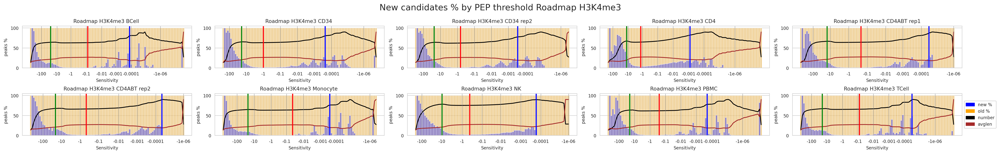

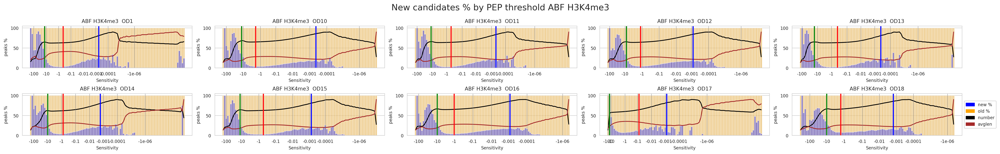

<Figure size 100x200 with 0 Axes>

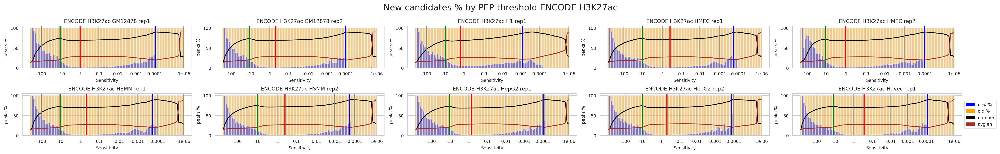

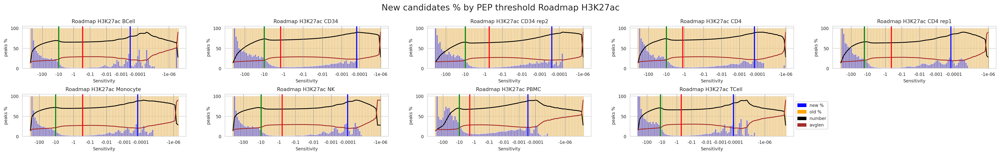

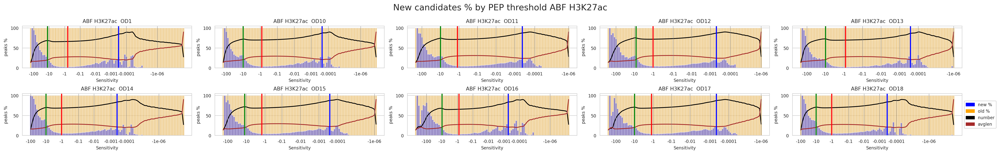

<Figure size 100x200 with 0 Axes>

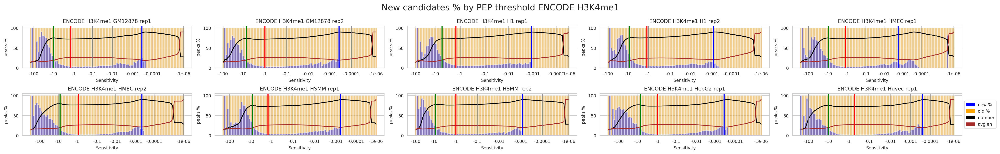

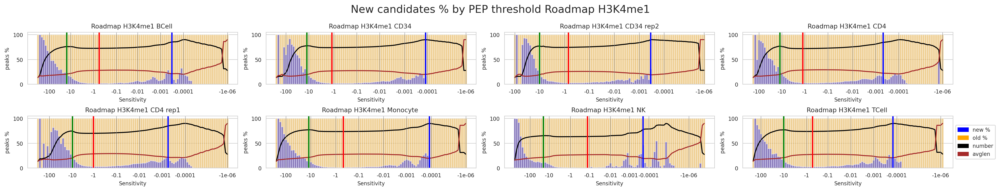

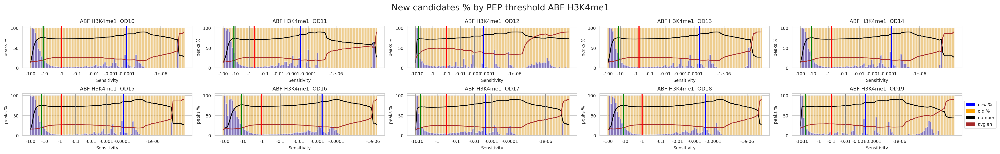

<Figure size 100x200 with 0 Axes>

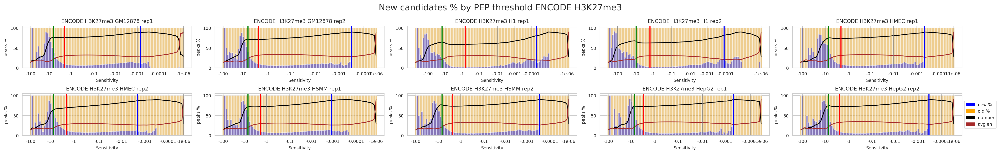

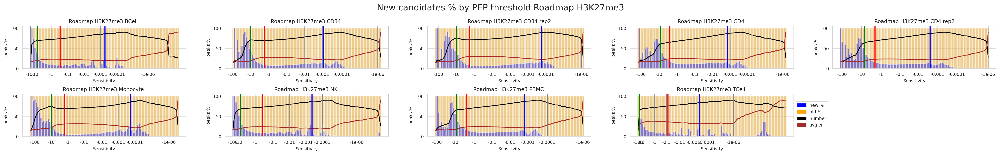

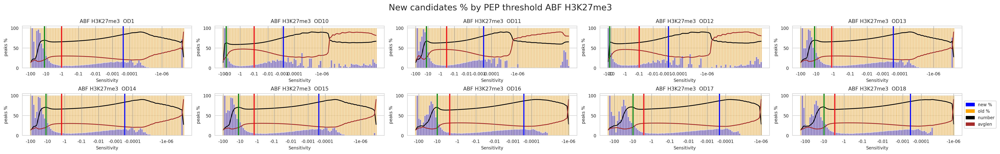

<Figure size 100x200 with 0 Axes>

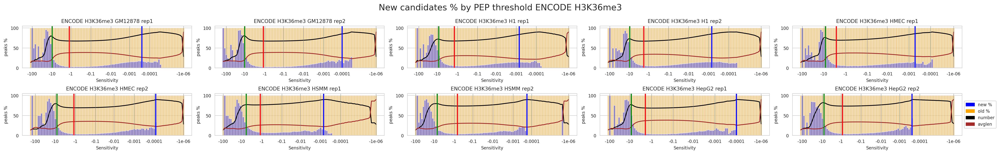

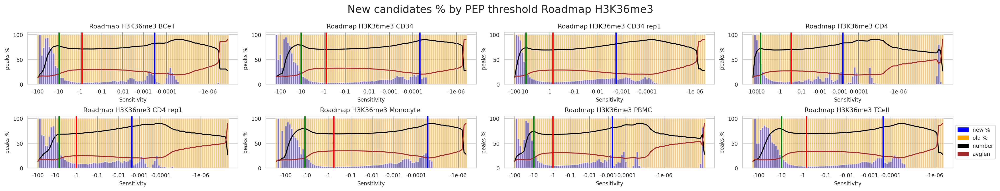

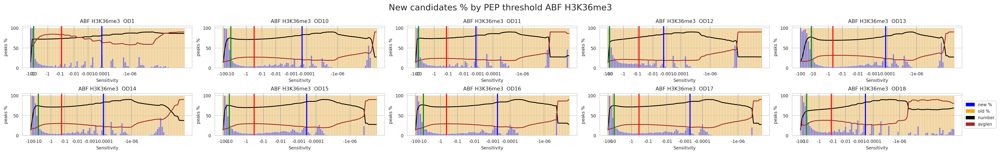

<Figure size 100x200 with 0 Axes>

In [58]:
MAX_N = 10
for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        dfdsm = segments_df[(segments_df['dataset'] == ds) &
                            (segments_df['modification'] == m)]
        n = min(len(dfdsm[['cell', 'replicate']].copy().drop_duplicates()), MAX_N)
        if n <= 6:
            ncols, nrows = n, 1
        else:
            ncols = int(math.floor(math.sqrt(n) + 2))
            nrows = int(math.ceil(n / ncols))
        fig = plt.figure(figsize=(5 * ncols + 1, 2 * nrows))
        fig.suptitle(f'New candidates % by PEP threshold {ds} {m}', fontsize=16)
        axs = [plt.subplot(nrows, ncols, i + 1) for i in range(n)]
        for i, ((cell, rep), sdf) in enumerate(dfdsm.groupby(['cell', 'replicate'])):
            if i == MAX_N:
                break
            t = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                                 (full_sensitivity['modification'] == m) &
                                 (full_sensitivity['cell'] == cell) &
                                 (full_sensitivity['replicate'] == rep)]
            ax = axs[i]
            name = f'{ds} {m} {cell} {rep}'
            sp = sps[name] if name in sps else None
            if i == n - 1:
                plot_segments(sdf, t, name, sp, ax, True)
                sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
            else:
                plot_segments(sdf, t, name, sp, ax, False)
        plt.tight_layout()
        plt.show()

# Coverage

## From files

In [59]:
ts = []
for m in MODIFICATIONS_ALL:
    for ds in DATASETS:
        print(ds, m)
        dfdsm = full_sensitivity[(full_sensitivity['dataset'] == ds) &
                                 (full_sensitivity['modification'] == m)]
        for (cell, rep), t in dfdsm.groupby(['cell', 'replicate']):
            if len(t['file'].unique()) != 1:
                continue
            assert len(t['file'].unique()) == 1
            cov = t['file'].values[0].replace('.sensitivity.tsv', '.coverage.tsv')
            if not os.path.exists(cov):
                continue
            t = pd.read_csv(cov, sep='\t')
            t['dataset'] = ds
            t['modification'] = m
            t['cell'] = cell
            t['replicate'] = rep
            ts.append(t)
cov_df = pd.concat(ts).reset_index(drop=True)
del ts
cov_df['CoverageI'] = cov_df['Coverage'].astype(int)
cov_df.sample(5)

ENCODE CTCF
Roadmap CTCF
ABF CTCF
ImmGen CTCF
ENCODE ATAC
Roadmap ATAC
ABF ATAC
ImmGen ATAC
ENCODE H3K4me3
Roadmap H3K4me3
ABF H3K4me3
ImmGen H3K4me3
ENCODE H3K27ac
Roadmap H3K27ac
ABF H3K27ac
ImmGen H3K27ac
ENCODE H3K4me1
Roadmap H3K4me1
ABF H3K4me1
ImmGen H3K4me1
ENCODE H3K27me3
Roadmap H3K27me3
ABF H3K27me3
ImmGen H3K27me3
ENCODE H3K36me3
Roadmap H3K36me3
ABF H3K36me3
ImmGen H3K36me3


,Q,Coverage,dataset,modification,cell,replicate,CoverageI
24795,96,4.000000,ABF,H3K4me3,,YD15,4
6842,43,1.000000,ImmGen,ATAC,Skin_draining_lymph_node_Stromal_Cell,SRR5799507,1
44120,21,0.630873,ABF,H3K27me3,,YD19,0
5612,13,1.000000,ImmGen,ATAC,Peritoneal_cavity_Macrophage,SRR5799497,1
15399,100,92.000000,ImmGen,ATAC,Spleen_NK_Cell,SRR5799411,92


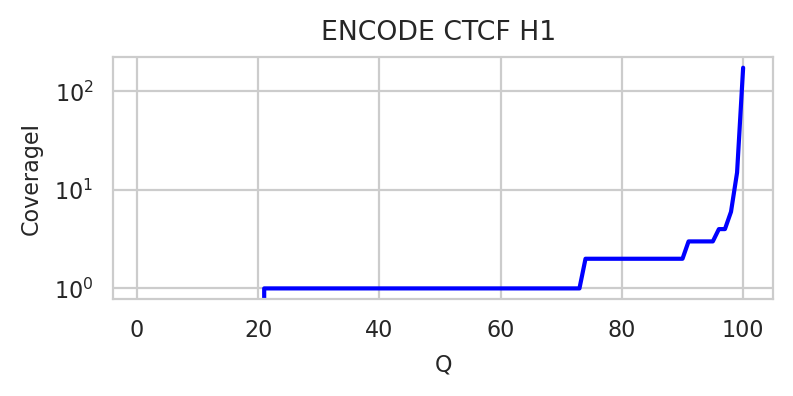

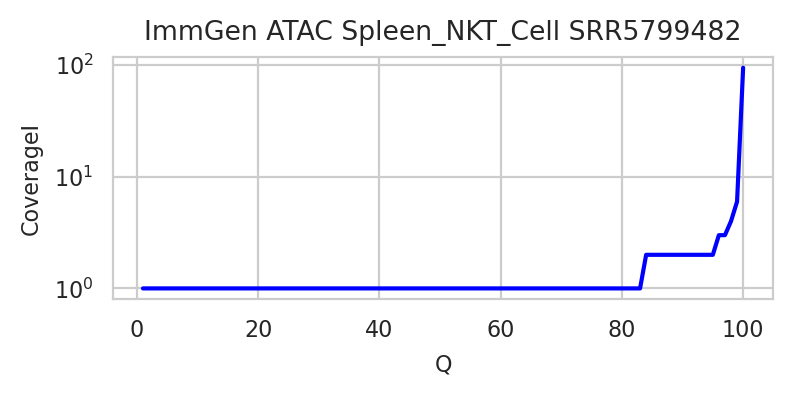

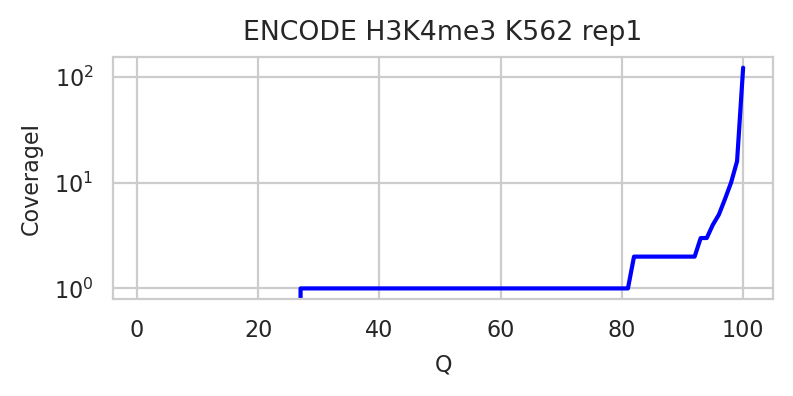

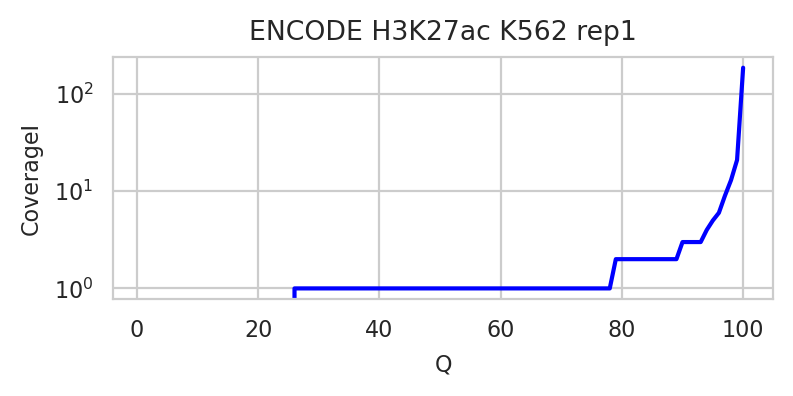

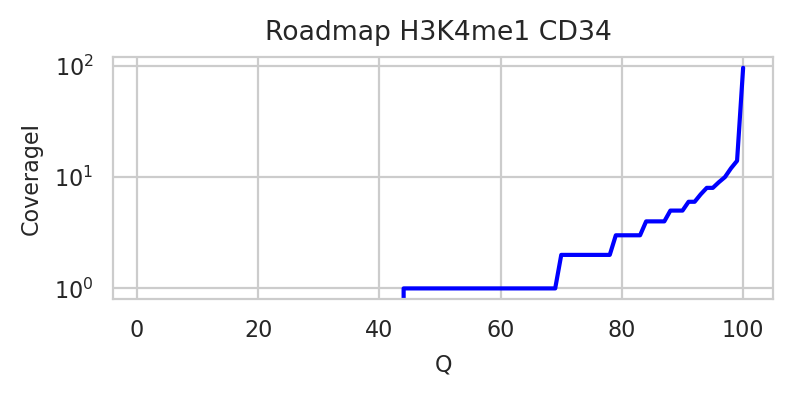

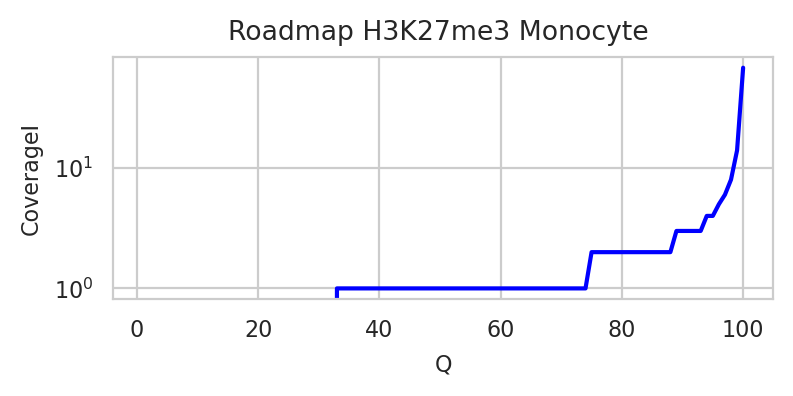

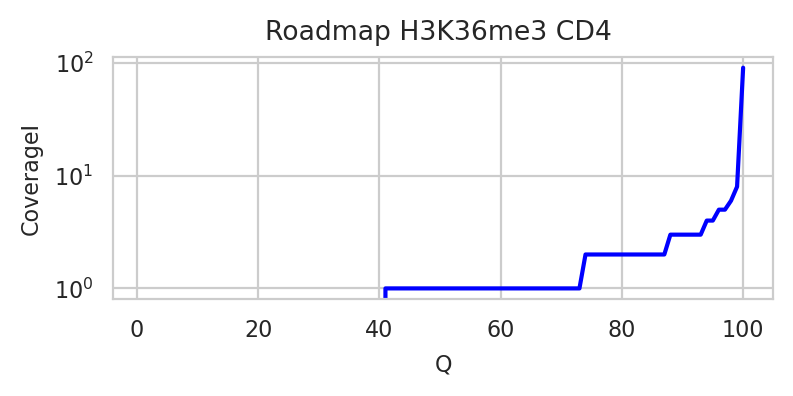

In [60]:
for (m, c, r, ds) in EXAMPLES:
    cov = cov_df[(cov_df['dataset'] == ds) &
                 (cov_df['modification'] == m) &
                 (cov_df['cell'] == c) &
                 (cov_df['replicate'] == r)]
    plt.figure(figsize=(4, 2))
    ax = plt.axes()
    sns.lineplot(cov, x='Q', y='CoverageI',
                 color='blue',
                 ax=ax)
    ax.set(yscale='log')
    ax.set_title(f'{ds} {m} {c} {r}')
    plt.tight_layout()
    plt.show()

## QQs

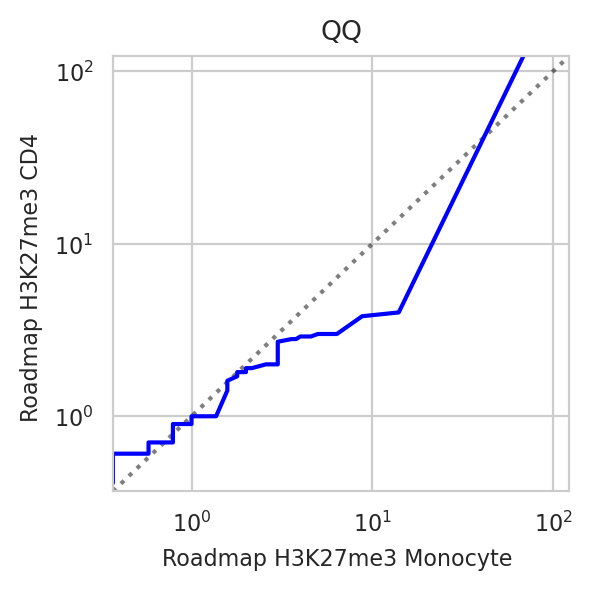

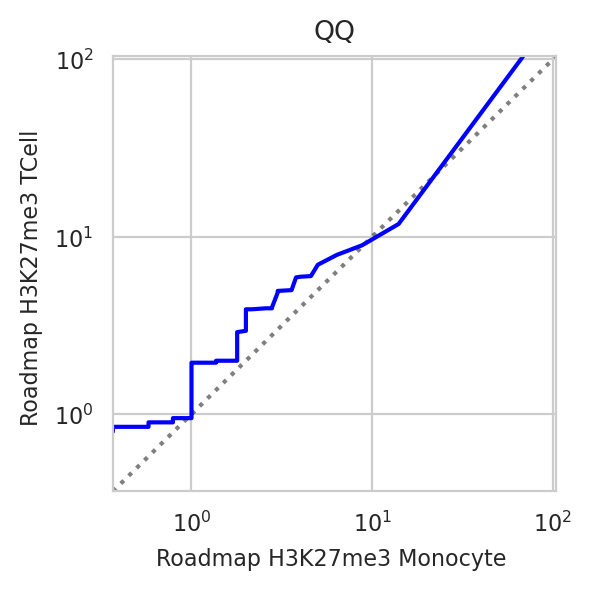

In [61]:
covs = []
for (m, c, r, ds) in [
    ('H3K27me3', 'Monocyte', '', 'Roadmap'),
    ('H3K27me3', 'CD4', '', 'Roadmap'),
    ('H3K27me3', 'TCell', '', 'Roadmap')
]:
    covs.append((f'{ds} {m} {c} {r}',
                 cov_df[(cov_df['dataset'] == ds) &
                        (cov_df['modification'] == m) &
                        (cov_df['cell'] == c) &
                        (cov_df['replicate'] == r)]))

for i, j in [(0, 1), (0, 2)]:
    n1, t1 = covs[i]
    n2, t2 = covs[j]
    plt.figure(figsize=(3, 3))
    ax = plt.axes()
    minxy = min(t1['Coverage'].min(), t2['Coverage'].min())
    maxxy = max(t1['Coverage'].max(), t2['Coverage'].max())
    sns.lineplot(x=[minxy, maxxy], y=[minxy, maxxy], ax=ax, color='black', alpha=0.5, linestyle='dotted')
    sns.lineplot(x=t1['Coverage'].tolist(), y=t2['Coverage'].tolist(),
                 color='blue',
                 sort=False, estimator=None,
                 ax=ax)
    ax.set(xscale='log')
    ax.set(yscale='log')
    ax.set_xlim(minxy, maxxy)
    ax.set_ylim(minxy, maxxy)
    ax.set_xlabel(n1)
    ax.set_ylabel(n2)
    ax.set_title('QQ')
    plt.tight_layout()
    plt.show()

## All

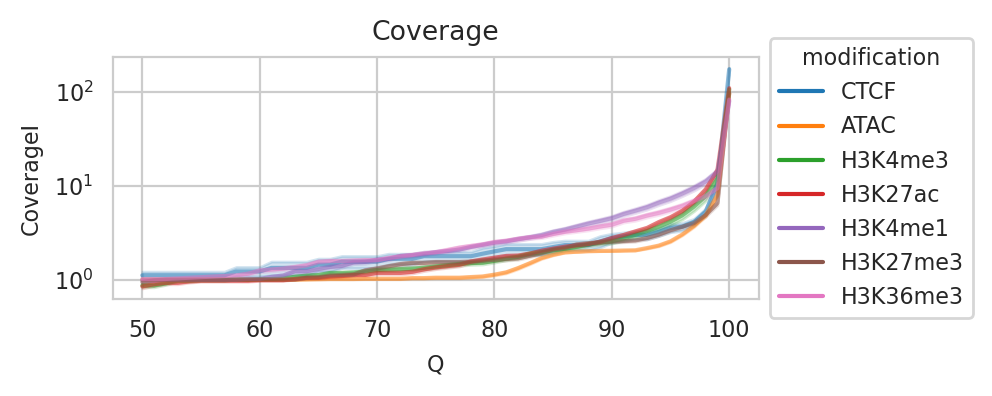

In [62]:
plt.figure(figsize=(5, 2))
ax = plt.axes()
sns.lineplot(cov_df[cov_df['Q'] >= 50],
             x='Q', y='CoverageI',
             hue='modification',
             hue_order=MODIFICATIONS_ALL,
             alpha=0.5, errorbar=('se', .95),
             ax=ax)
ax.set_title('Coverage')
ax.set(yscale='log')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

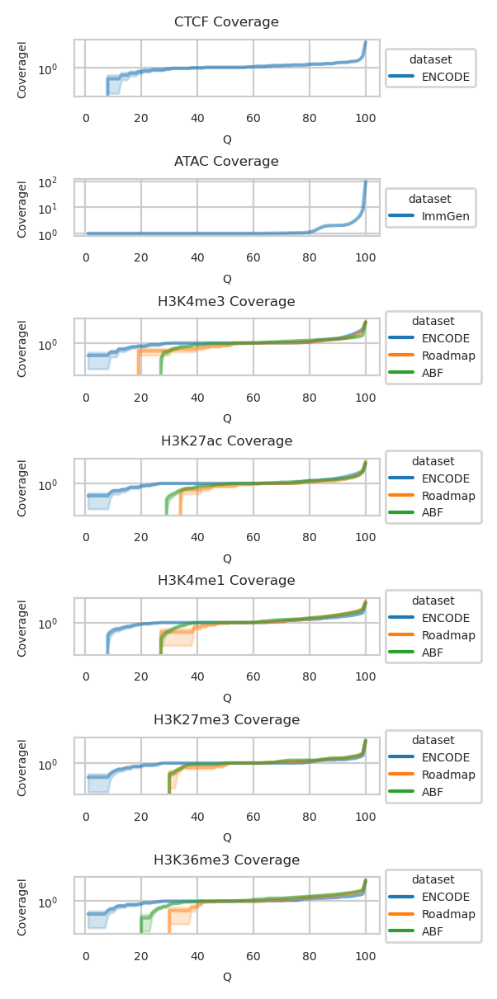

In [63]:
plt.rc('font', size=5)
plt.figure(figsize=(3, 6))
axs = [plt.subplot(7, 1, i + 1) for i in range(7)]
for i, m in enumerate(MODIFICATIONS_ALL):
    ax = axs[i]
    sns.lineplot(cov_df[cov_df['modification'] == m],
                 x='Q', y='CoverageI',
                 hue='dataset',
                 alpha=0.5, errorbar=('se', .95),
                 ax=ax)
    ax.set_title(f'{m} Coverage')
    ax.set(yscale='log')
    sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()
plt.rc('font', size=8)

# END